In [1]:
from __future__ import print_function
%matplotlib inline
import mdtraj as md
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy
from scipy.spatial.distance import squareform
import pandas as pd
import matplotlib.gridspec as gridspec
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')
import MDAnalysis as mda
from statistics import mode
import ast
import msmexplorer as msme
from msmbuilder.utils import load,dump
import itertools
from msmbuilder.featurizer import ContactFeaturizer
from msmbuilder.featurizer import DihedralFeaturizer
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
#XRD Ensemble
#28 4NPQ
#18 4HFI

In [2]:
import pickle

In [3]:
default_location = '/home/scottzhuang/pdc/'
default_skip = 10

In [4]:
def create_md_dataframe():    
    md_data = pd.DataFrame(columns=list(['MD_name','pH','replicate','intersubunit','traj_time']))
    return md_data

In [5]:
def create_metadata(md_data= None):   
    def append_metadata(traj_note, location = default_location, skip = default_skip, md_data = md_data):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
        if traj_note.find('ethanol') >= 0:
            print("In " + traj_note + ", simulation runs " + str(skip * traj.n_frames / 2 ) + " ns.")
        else:
            print("In " + traj_note + ", simulation runs " + str(skip * traj.n_frames) + " ns.")

        md_name = traj_note[:traj_note.find('pH')-1]
        pH = traj_note[traj_note.find('pH')+2:traj_note.find('pH')+4]
        md_replicate = traj_note[-1]
        for i in range(0,traj.n_frames):
            for subunit in range(0,5):
                md_data.loc[md_data.shape[0]+1] = [md_name,pH,md_replicate,subunit,i]

    for traj_note in traj_notes:
        append_metadata(traj_note)
    md_data['traj_time'] =md_data['traj_time'].apply(int)

In [6]:
def create_system_notation(md_data = None):
    system_notation = 0
    notation = -1
    location = default_location
    skip= default_skip

    notations = []
    increment = 0
    for traj_note in traj_notes:
        if traj_note.find('ethanol') >= 0:
            top_location = traj_note + '/' + traj_note + ".ca.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip*2) + ".ca.xtc"
        else:
            top_location = traj_note + '/' + traj_note + ".ca.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
#        if traj_note.find('md1') >= 0:
#            notation = notation + 1
#        if traj_note.find('md4') >= 0:
#            notation = notation + 1
#       if traj_note.find('md7') >= 0:
#            notation = notation + 1
        if traj_note in notation_changer:
            notation = notation + 1
            

        for frame in range(0,traj.n_frames):
            for subunit in range(0,5):
                notations.append(notation)
        #if increment % 3 == 2:
        #    notation = notation + 1
        #increment = increment + 1 
    md_data['system'] = notations

In [7]:
def create_rmsd_data(md_data= None, ref_name = None, select_domain = None):
    def append_rmsd_data(traj_note, subunit, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        residue_selection_1 = "resSeq 13 to 198"
        residue_selection_2 = "resSeq 198 to 316"
        top_location = traj_note + '/' + traj_note + ".ca.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
        traj = traj.atom_slice(traj.topology.select('chainid ' + str(subunit)))
        ref_location = location + top_location
        ref_traj = md.load(ref_location)
        ref_traj = ref_traj.atom_slice(ref_traj.topology.select('chainid ' + str(subunit)))
        traj.superpose(ref_traj,0)
        traj_rmsd_data.extend(list(md.rmsd(traj, ref_traj)*10))
    rmsd_data = []
    for traj_note in traj_notes:
        traj_rmsd_data = []

        for subunit in range(0,5):
            append_rmsd_data(traj_note,subunit)
        rmsd_data.extend(list(np.asarray(traj_rmsd_data).reshape(5,int(np.asarray(traj_rmsd_data).shape[0]/5)).T.ravel()))

    md_data['rmsd']= rmsd_data

In [8]:
def create_cppca_data(md_data = None): 
    def combined_ppca_reduced_cartesian():
        tmdtraj = md.load('/home/scottzhuang/masterthesis/miscellanies/pdb_ensemble/ensemble_subunit_tmd.pdb')
        ecdtraj = md.load('/home/scottzhuang/masterthesis/miscellanies/pdb_ensemble/ensemble_subunit_ecd.pdb')
        ppca_ecd = PCA(n_components=2)
        ppca_tmd = PCA(n_components=2)
        partial_reduced_cartesian = [ppca_ecd.fit_transform(ecdtraj.xyz.reshape(ecdtraj.n_frames, ecdtraj.n_atoms * 3)), ppca_tmd.fit_transform(tmdtraj.xyz.reshape(tmdtraj.n_frames, tmdtraj.n_atoms * 3))]    
        print(ppca_ecd.explained_variance_ratio_)
        print(ppca_tmd.explained_variance_ratio_)
        return partial_reduced_cartesian, ecdtraj, tmdtraj,ppca_ecd,ppca_tmd

    def append_projection_on_combined_ppca_data(traj_note, subunit, location = default_location, skip = default_skip, residue_selection_1 = "resSeq 8 to 192", residue_selection_2 = "resSeq 192 to 315"):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
        topology = traj.topology
        traj_sliced_ecd = traj.atom_slice(topology.select(residue_selection_1 + 'and chainid ' + str(subunit) ))
        traj_sliced_tmd = traj.atom_slice(topology.select(residue_selection_2 + 'and chainid ' + str(subunit) ))

        traj_sliced_ecd.superpose(wholetraj_sliced_ecd,0)
        traj_sliced_tmd.superpose(wholetraj_sliced_tmd,0)

        reduced_cartesian_ecd_pc1.extend(ppca_ecd.transform(traj_sliced_ecd.xyz.reshape(traj_sliced_ecd.n_frames, traj_sliced_ecd.n_atoms * 3)).T[0])
        reduced_cartesian_ecd_pc2.extend(ppca_ecd.transform(traj_sliced_ecd.xyz.reshape(traj_sliced_ecd.n_frames, traj_sliced_ecd.n_atoms * 3)).T[1])
        reduced_cartesian_tmd_pc1.extend(ppca_tmd.transform(traj_sliced_tmd.xyz.reshape(traj_sliced_tmd.n_frames, traj_sliced_tmd.n_atoms * 3)).T[0])
        reduced_cartesian_tmd_pc2.extend(ppca_tmd.transform(traj_sliced_tmd.xyz.reshape(traj_sliced_tmd.n_frames, traj_sliced_tmd.n_atoms * 3)).T[1])
        
    reduced_cartesian_ecd_pc1 = []
    reduced_cartesian_ecd_pc2 = []
    reduced_cartesian_tmd_pc1 = []
    reduced_cartesian_tmd_pc2 = []
    partial_reduced_cartesian, wholetraj_sliced_ecd,wholetraj_sliced_tmd, ppca_ecd,ppca_tmd = combined_ppca_reduced_cartesian()

    for traj_note in traj_notes:
        for subunit in range(0,5):
            append_projection_on_combined_ppca_data(traj_note,subunit)
    md_data['ecd_pc1']= reduced_cartesian_ecd_pc1
    md_data['ecd_pc2']= reduced_cartesian_ecd_pc2
    md_data['tmd_pc1']= reduced_cartesian_tmd_pc1
    md_data['tmd_pc2']= reduced_cartesian_tmd_pc2

In [9]:
def create_helix_tilt_data(md_data = None):
    def append_helix_tilt_data(traj_note,subunit, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        tilt_data = pd.read_csv(location + traj_note + '/analysis/' + traj_note + '.tilt.csv',sep=" ")
        tilt_data.columns = ['traj_time','avg','ang1','ang2','ang3','ang4','ang5']
        traj_helix_tilt_data.extend(tilt_data['ang' + str(subunit+1)])

    helix_tilt_data = []
    for traj_note in traj_notes:
        traj_helix_tilt_data = []
        for subunit in range(0,5):
            append_helix_tilt_data(traj_note,subunit)
        helix_tilt_data.extend(list(np.asarray(traj_helix_tilt_data).reshape(5,int(np.asarray(traj_helix_tilt_data).shape[0]/5)).T.ravel()))

    md_data['helix tilt angle'] = helix_tilt_data

In [10]:
def create_helix_twist_data(md_data = None):
    def append_helix_twist_data(traj_note,subunit, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        twist_data = pd.read_csv(location + traj_note + '/analysis/' + traj_note + '.twist.csv',sep=" ")
        twist_data.columns = ['traj_time','avg','ang1','ang2','ang3','ang4','ang5']
        traj_helix_twist_data.extend(twist_data['ang' + str(subunit+1)])
        
    helix_twist_data = []
    for traj_note in traj_notes:
        traj_helix_twist_data = []

        for subunit in range(0,5):
            append_helix_twist_data(traj_note,subunit)
        helix_twist_data.extend(list(np.asarray(traj_helix_twist_data).reshape(5,int(np.asarray(traj_helix_twist_data).shape[0]/5)).T.ravel()))

    md_data['helix twist angle'] = helix_twist_data

In [11]:
def create_beta_expansion(md_data = None):
    def append_beta_expansion_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        distance = []
        for chain in range(0,5):
            distance.append(md.compute_distances(traj,[[27 + chain * 311,187 + chain * 311]]))
        beta_expansion_data.extend(np.mean(distance,axis=0).T[0])
    beta_expansion_data = []
    for traj_note in traj_notes:
        append_beta_expansion_data(traj_note)
    md_data['beta_expansion'] = beta_expansion_data

In [25]:
subunit_dic = {0:0,1:1,2:2,3:3,4:4,5:0}

In [13]:
def create_M2_M1_distance(md_data = None):
    def distance_calculate(x,y):
        dist = np.sqrt(np.power(x[0]-y[0],2) + np.power(x[1]-y[1],2) + np.power(x[2]-y[2],2))
        return dist
    def append_M2_M1_distance_data(traj_note,subunit,location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        topology = traj.topology
        distance = []
        M1_selection = 'resid ' + str(192 + subunit_dic[subunit] * 311) + ' to ' + str(196 + subunit_dic[subunit] * 311)
        M2_selection = 'resid ' + str(233 + (subunit_dic[subunit+1]) * 311) + ' to ' + str(238 + (subunit_dic[subunit+1]) * 311)
        traj_M1 = traj.atom_slice(topology.select(M1_selection))
        traj_M2 = traj.atom_slice(topology.select(M2_selection))
        distance.append(distance_calculate(md.compute_center_of_mass(traj_M1).T,md.compute_center_of_mass(traj_M2).T))
        traj_M2_M1_distance.extend(distance[0])

    M2_M1_distance = []

    for traj_note in traj_notes:
        traj_M2_M1_distance = []
        for subunit in range(0,5):
            append_M2_M1_distance_data(traj_note,subunit)
            
        M2_M1_distance.extend(list(np.asarray(traj_M2_M1_distance).reshape(5,int(np.asarray(traj_M2_M1_distance).shape[0]/5)).T.ravel()))

    md_data['M1(n)_M2(n+1)_distance'] = M2_M1_distance


In [14]:
def create_M1_kink(md_data = None):
    def angle_calculate(x,y,z):
        angle_set = []
        for i in range(0,x.shape[0]):
            angle_set.append(180 - 57.29 * np.arccos(np.dot((x[i]-y[i]),(z[i]-y[i]))/(np.linalg.norm(x[i]-y[i]) * np.linalg.norm(z[i]-y[i]))))
        return angle_set
    def append_M1_kink_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        topology = traj.topology
        angle = []
        for chain in range(0,5):
            M1_selection_up = 'resid ' + str(192 + chain * 311) + ' to ' + str(196 + chain * 311)
            M1_selection_mid = 'resid ' + str(194 + chain * 311) + ' to ' + str(198 + chain * 311)
            M1_selection_down = 'resid ' + str(197 + chain * 311) + ' to ' + str(208 + chain * 311)

            M1_up = traj.atom_slice(topology.select(M1_selection_up))
            M1_mid = traj.atom_slice(topology.select(M1_selection_mid))
            M1_down = traj.atom_slice(topology.select(M1_selection_down))
            angle.append(angle_calculate(md.compute_center_of_mass(M1_up), md.compute_center_of_mass(M1_mid), md.compute_center_of_mass(M1_down)))
        M1_kink.extend(np.asarray(angle).T.ravel())
    M1_kink = []
    for traj_note in traj_notes:
        append_M1_kink_data(traj_note)
    md_data['M1_kink'] = M1_kink


In [15]:
def create_M2_kink(md_data = None):
    def angle_calculate(x,y,z):
        angle_set = []
        for i in range(0,x.shape[0]):
            angle_set.append(180 - 57.29 * np.arccos(np.dot((x[i]-y[i]),(z[i]-y[i]))/(np.linalg.norm(x[i]-y[i]) * np.linalg.norm(z[i]-y[i]))))
        return angle_set
    def append_M2_kink_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        topology = traj.topology
        angle = []
        for chain in range(0,5):
            M2_selection_up = 'resid ' + str(216 + chain * 311) + ' to ' + str(233 + chain * 311)
            M2_selection_mid = 'resid ' + str(233 + chain * 311) + ' to ' + str(233 + chain * 311)
            M2_selection_down = 'resid ' + str(233 + chain * 311) + ' to ' + str(240 + chain * 311)

            M2_up = traj.atom_slice(topology.select(M2_selection_up))
            M2_mid = traj.atom_slice(topology.select(M2_selection_mid))
            M2_down = traj.atom_slice(topology.select(M2_selection_down))
            angle.append(angle_calculate(md.compute_center_of_mass(M2_up), md.compute_center_of_mass(M2_mid), md.compute_center_of_mass(M2_down)))
        M2_kink.extend(np.asarray(angle).T.ravel())
    M2_kink = []
    for traj_note in traj_notes:
        append_M2_kink_data(traj_note)
    md_data['M2_kink'] = M2_kink


In [16]:
def create_beta_expansion(md_data = None):
    def append_beta_expansion_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        distance = []
        for chain in range(0,5):
            distance.append(md.compute_distances(traj,[[27 + chain * 311,187 + chain * 311]]))
        beta_expansion_data.extend(np.asarray(distance).T.ravel())
    beta_expansion_data = []
    for traj_note in traj_notes:
        append_beta_expansion_data(traj_note)
    md_data['beta_expansion'] = beta_expansion_data

In [182]:
subunit_dic_mda = {0:'A',1:'B',2:'C',3:'D',4:'E',5:'A'}

In [187]:
def create_intersubunit_hydration_data(md_data = None):
    def create_intersubunit_ethanol_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".system.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(default_location + top_location,default_location + traj_location)
        for subunit in range(0,5):
            ethanolation = traj.select_atoms('name OW and (around 6 (protein and resid 200 and segid ' + subunit_dic_mda[subunit]  + ')) and (around 6 (protein and resid 263 and segid ' + subunit_dic_mda[subunit+1] + '))' , updating = True)
            for i in range(0,traj.trajectory.n_frames):
                traj.trajectory[i]
                traj_ethanol_data.append(ethanolation.n_atoms)
        ethanol_data.extend(list(np.asarray(traj_ethanol_data).reshape(5,traj.trajectory.n_frames).T.ravel()))

    ethanol_data = []
    for traj_note in traj_notes:
        traj_ethanol_data = []
        create_intersubunit_ethanol_data(traj_note)
    #return ethanol_data
    #ethanol_data = np.asarray(ethanol_data).reshape(traj.trajectory.n_frames,5).T.ravel()
    md_data['intersubunit_hydration_right'] = ethanol_data

In [188]:
def create_intrasubunit_hydration_data(md_data = None):
    def create_intersubunit_ethanol_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".system.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(default_location + top_location,default_location + traj_location)
        for subunit in range(0,5):
            ethanolation = traj.select_atoms('name OW and (around 6 (resid 202 and segid ' + subunit_dic_mda[subunit]  + ')) and (around 6 (resid 235 and segid ' + subunit_dic_mda[subunit] + '))' , updating = True)
            for i in range(0,traj.trajectory.n_frames):
                traj.trajectory[i]
                traj_ethanol_data.append(ethanolation.n_atoms)
        ethanol_data.extend(list(np.asarray(traj_ethanol_data).reshape(5,traj.trajectory.n_frames).T.ravel()))

    ethanol_data = []
    for traj_note in traj_notes:
        traj_ethanol_data = []
        create_intersubunit_ethanol_data(traj_note)
    #return ethanol_data
    #ethanol_data = np.asarray(ethanol_data).reshape(traj.trajectory.n_frames,5).T.ravel()
    md_data['intrasubunit_hydration'] = ethanol_data

In [189]:
def create_intersubunit_ethanol_data(md_data = None):
    def create_intersubunit_ethanol_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".system.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(default_location + top_location,default_location + traj_location)
        for subunit in range(0,5):
            ethanolation = traj.select_atoms('resname LIG and (around 6 (protein and resid 200 and segid ' + subunit_dic_mda[subunit]  + ')) and (around 6 (protein and resid 263 and segid ' + subunit_dic_mda[subunit+1] + '))' , updating = True)
            for i in range(0,traj.trajectory.n_frames):
                traj.trajectory[i]
                traj_ethanol_data.append(ethanolation.n_atoms)
        ethanol_data.extend(list(np.asarray(traj_ethanol_data).reshape(5,traj.trajectory.n_frames).T.ravel()))

    ethanol_data = []
    for traj_note in traj_notes:
        traj_ethanol_data = []
        create_intersubunit_ethanol_data(traj_note)
    #return ethanol_data
    #ethanol_data = np.asarray(ethanol_data).reshape(traj.trajectory.n_frames,5).T.ravel()
    md_data['intersubunit_ethanol_right'] = ethanol_data

In [190]:
def create_intersubunit_ethanol_data_2(md_data = None):
    def create_intersubunit_ethanol_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".system.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(default_location + top_location,default_location + traj_location)
        for subunit in [4,0,1,2,3]:
            ethanolation = traj.select_atoms('resname LIG and (around 6 (protein and resid 200 and segid ' + subunit_dic_mda[subunit]  + ')) and (around 6 (protein and resid 263 and segid ' + subunit_dic_mda[subunit+1] + '))' , updating = True)
            for i in range(0,traj.trajectory.n_frames):
                traj.trajectory[i]
                traj_ethanol_data.append(ethanolation.n_atoms)
        ethanol_data.extend(list(np.asarray(traj_ethanol_data).reshape(5,traj.trajectory.n_frames).T.ravel()))

    ethanol_data = []
    for traj_note in traj_notes:
        traj_ethanol_data = []
        create_intersubunit_ethanol_data(traj_note)
    #return ethanol_data
    #ethanol_data = np.asarray(ethanol_data).reshape(traj.trajectory.n_frames,5).T.ravel()
    md_data['intersubunit_ethanol_left'] = ethanol_data

In [191]:
def create_intersubunit_ethanol_data_5(md_data = None):
    def create_intersubunit_ethanol_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".system.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(default_location + top_location,default_location + traj_location)
        for subunit in range(0,5):
            ethanolation = traj.select_atoms('resname LIG and (around 6 (protein and resid 263 and segid ' + subunit_dic_mda[subunit]  + ')) and (around 6 (protein and resid 238 and segid ' + subunit_dic_mda[subunit]  + '))' , updating = True)
            for i in range(0,traj.trajectory.n_frames):
                traj.trajectory[i]
                traj_ethanol_data.append(ethanolation.n_atoms)
        ethanol_data.extend(list(np.asarray(traj_ethanol_data).reshape(5,traj.trajectory.n_frames).T.ravel()))

    ethanol_data = []
    for traj_note in traj_notes:
        traj_ethanol_data = []
        create_intersubunit_ethanol_data(traj_note)
    #return ethanol_data
    #ethanol_data = np.asarray(ethanol_data).reshape(traj.trajectory.n_frames,5).T.ravel()
    md_data['intersubunit_ethanol_238_right'] = ethanol_data

In [192]:
def create_intrasubunit_ethanol_data(md_data = None):
    def create_intersubunit_ethanol_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".system.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(default_location + top_location,default_location + traj_location)
        for subunit in range(0,5):
            ethanolation = traj.select_atoms('resname LIG and (around 6 (resid 202 and segid ' + subunit_dic_mda[subunit]  + ')) and (around 6 (resid 235 and segid ' + subunit_dic_mda[subunit] + '))' , updating = True)
            for i in range(0,traj.trajectory.n_frames):
                traj.trajectory[i]
                traj_ethanol_data.append(ethanolation.n_atoms)
        ethanol_data.extend(list(np.asarray(traj_ethanol_data).reshape(5,traj.trajectory.n_frames).T.ravel()))

    ethanol_data = []
    for traj_note in traj_notes:
        traj_ethanol_data = []
        create_intersubunit_ethanol_data(traj_note)
    #return ethanol_data
    #ethanol_data = np.asarray(ethanol_data).reshape(traj.trajectory.n_frames,5).T.ravel()
    md_data['intrasubunit_ethanol'] = ethanol_data

In [198]:
def create_intrasubunit_ethanol_data_2(md_data = None):
    def create_intersubunit_ethanol_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".system.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(default_location + top_location,default_location + traj_location)
        for subunit in range(0,5):
            ethanolation = traj.select_atoms('resname LIG and (around 9 (name CA and resid 262 and segid ' + subunit_dic_mda[subunit]  + ')) and (around 9 (name CA and resid 235 and segid ' + subunit_dic_mda[subunit] + '))' , updating = True)
            for i in range(0,traj.trajectory.n_frames):
                traj.trajectory[i]
                traj_ethanol_data.append(ethanolation.n_atoms)
        ethanol_data.extend(list(np.asarray(traj_ethanol_data).reshape(5,traj.trajectory.n_frames).T.ravel()))

    ethanol_data = []
    for traj_note in traj_notes:
        traj_ethanol_data = []
        create_intersubunit_ethanol_data(traj_note)
    #return ethanol_data
    #ethanol_data = np.asarray(ethanol_data).reshape(traj.trajectory.n_frames,5).T.ravel()
    md_data['intrasubunit_ethanol_2'] = ethanol_data

In [199]:
def create_intrasubunit_ethanol_data_3(md_data = None):
    def create_intersubunit_ethanol_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".system.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(default_location + top_location,default_location + traj_location)
        for subunit in range(0,5):
            ethanolation = traj.select_atoms('resname LIG and (around 6 (resid 205 and name SD and segid ' + subunit_dic_mda[subunit]  + '))', updating = True)
            for i in range(0,traj.trajectory.n_frames):
                traj.trajectory[i]
                traj_ethanol_data.append(ethanolation.n_atoms)
        ethanol_data.extend(list(np.asarray(traj_ethanol_data).reshape(5,traj.trajectory.n_frames).T.ravel()))

    ethanol_data = []
    for traj_note in traj_notes:
        traj_ethanol_data = []
        create_intersubunit_ethanol_data(traj_note)
    #return ethanol_data
    #ethanol_data = np.asarray(ethanol_data).reshape(traj.trajectory.n_frames,5).T.ravel()
    md_data['intrasubunit_ethanol_3'] = ethanol_data

In [195]:
def create_intrasubunit_hydration_data_3(md_data = None):
    def create_intersubunit_hydration_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".system.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(default_location + top_location,default_location + traj_location)
        for subunit in range(0,5):
            hydration = traj.select_atoms('name OW and (around 6 (resid 205 and name SD and segid ' + subunit_dic_mda[subunit]  + '))' , updating = True)
            for i in range(0,traj.trajectory.n_frames):
                traj.trajectory[i]
                traj_hydration_data.append(hydration.n_atoms)
        hydration_data.extend(list(np.asarray(traj_hydration_data).reshape(5,traj.trajectory.n_frames).T.ravel()))

    hydration_data = []
    for traj_note in traj_notes:
        traj_hydration_data = []
        create_intersubunit_hydration_data(traj_note)
    md_data['intrasubunit_hydration_2'] = hydration_data

In [33]:
def create_tica_cluster_data(md_data = None):
    def append_tica_cluster_data(md_data,skip=default_skip,location=default_location):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".protein.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".protein.xtc"
        for subunit in range(0,5):
            traj = md.load(location + traj_location,top = location + top_location)
            traj = traj.atom_slice(traj.topology.select('((chainid ' + str(subunit_dic[subunit]) + ') and (mass > 2) and resSeq 192 to 246) or ((chainid ' + str(subunit_dic[subunit+1]) + ') and (mass > 2) and resSeq 222 to 280)'))
            diheds = featurizer.transform(traj)
            scaled_diheds = scaler.transform(diheds)
            tica_trajs = tica_model.transform(scaled_diheds)
            label = cluster.predict(np.asarray(tica_trajs).ravel().reshape(int(np.asarray(tica_trajs).ravel().shape[0]/tica_model.n_components),tica_model.n_components))
            traj_cluster_data.append(label)
        cluster_data.extend(list(np.asarray(traj_cluster_data).reshape(5,traj.n_frames).T.ravel()))
    cluster_data = []
    featurizer = pickle.load(open('../pdc/msm/F238L_intersubunit/featurizer_F238L_tmd.pickle','rb'))
    scaler = pickle.load(open('../pdc/msm/F238L_intersubunit/scaler_F238L_tmd.pickle','rb'))
    tica_model = pickle.load(open('../pdc/msm/F238L_intersubunit/tica_model_F238L_tmd.pickle','rb'))
    cluster = pickle.load(open('../pdc/msm/F238L_intersubunit/F238L_tmd_cluster.pickle','rb'))
    for traj_note in traj_notes:
        traj_cluster_data = []
        append_tica_cluster_data(traj_note)
    md_data['tica_cluster'] = cluster_data

In [177]:
traj_notes =  [
              '4HFI_pH46_ethanol_md1','4HFI_pH46_ethanol_md2','4HFI_pH46_ethanol_md3',
                '4HFI_F238L_pH46_ethanol_md4','4HFI_F238L_pH46_ethanol_md5','4HFI_F238L_pH46_ethanol_md6',
              '4HFI_I233T_pH46_ethanol_md1','4HFI_I233T_pH46_ethanol_md2','4HFI_I233T_pH46_ethanol_md3',
                '4HFI_F238LI233T_pH46_ethanol_md1','4HFI_F238LI233T_pH46_ethanol_md2','4HFI_F238LI233T_pH46_ethanol_md3',
            '4HFI_F238LI233T_pH46_ethanol_md4','4HFI_F238LI233T_pH46_ethanol_md5','4HFI_F238LI233T_pH46_ethanol_md6']


In [212]:
notation_changer = [
                   '4HFI_pH46_ethanol_md1',
                '4HFI_F238L_pH46_ethanol_md4','4HFI_F238L_pH46_ethanol_md1',
              '4HFI_I233T_pH46_ethanol_md1',
                '4HFI_F238LI233T_pH46_ethanol_md1','4HFI_F238LI233T_pH46_ethanol_md4']

In [283]:
md_data = pd.read_pickle('glic_activation_intersubunit_ethanol_open.pickle')

In [179]:
md_data = create_md_dataframe()
create_metadata(md_data)
create_system_notation(md_data)
create_cppca_data(md_data)

In 4HFI_pH46_ethanol_md1, simulation runs 850.0 ns.
In 4HFI_pH46_ethanol_md2, simulation runs 680.0 ns.
In 4HFI_pH46_ethanol_md3, simulation runs 730.0 ns.
In 4HFI_F238L_pH46_ethanol_md4, simulation runs 900.0 ns.
In 4HFI_F238L_pH46_ethanol_md5, simulation runs 1020.0 ns.
In 4HFI_F238L_pH46_ethanol_md6, simulation runs 1010.0 ns.
In 4HFI_I233T_pH46_ethanol_md1, simulation runs 780.0 ns.
In 4HFI_I233T_pH46_ethanol_md2, simulation runs 660.0 ns.
In 4HFI_I233T_pH46_ethanol_md3, simulation runs 680.0 ns.
In 4HFI_F238LI233T_pH46_ethanol_md1, simulation runs 480.0 ns.
In 4HFI_F238LI233T_pH46_ethanol_md2, simulation runs 670.0 ns.
In 4HFI_F238LI233T_pH46_ethanol_md3, simulation runs 680.0 ns.
In 4HFI_F238LI233T_pH46_ethanol_md4, simulation runs 200.0 ns.
In 4HFI_F238LI233T_pH46_ethanol_md5, simulation runs 180.0 ns.
In 4HFI_F238LI233T_pH46_ethanol_md6, simulation runs 180.0 ns.
[ 0.53211844  0.21386909]
[ 0.67002475  0.20237753]


In [180]:
create_rmsd_data(md_data)
create_helix_tilt_data(md_data)
create_helix_twist_data(md_data)
create_M2_M1_distance(md_data)
create_M1_kink(md_data)
create_M2_kink(md_data)

In [186]:
create_intersubunit_ethanol_data(md_data)

In [202]:
create_intersubunit_ethanol_data_2(md_data)

In [203]:
create_intersubunit_ethanol_data_5(md_data)

In [200]:
create_intrasubunit_ethanol_data(md_data)

In [201]:
create_intrasubunit_ethanol_data_2(md_data)
create_intrasubunit_ethanol_data_3(md_data)

In [229]:
create_intrasubunit_hydration_data_3(md_data)
create_intrasubunit_hydration_data(md_data)
create_intersubunit_hydration_data(md_data)

In [85]:
create_beta_expansion(md_data)

In [230]:
md_data.to_pickle('glic_activation_intersubunit_ethanol_open.pickle')

In [221]:
import seaborn as sns
import ptitprince as pt
sns.set(style="whitegrid",font_scale=2)
import matplotlib.collections as clt

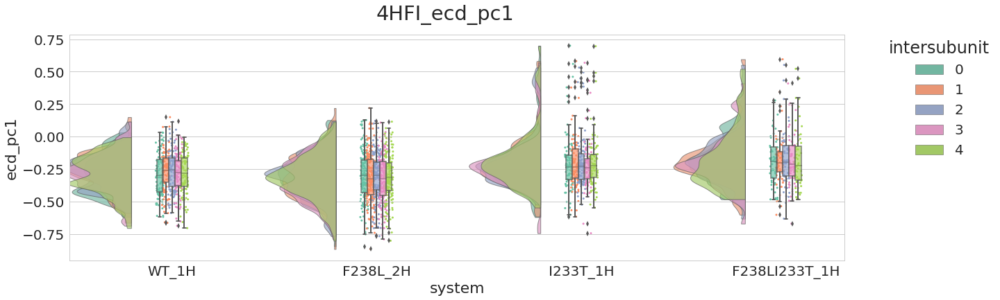

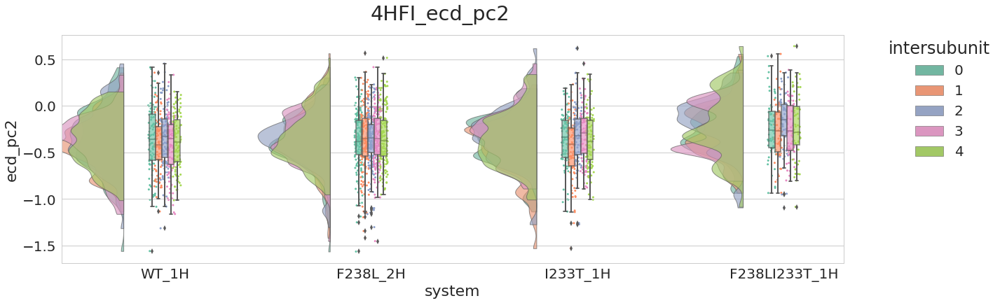

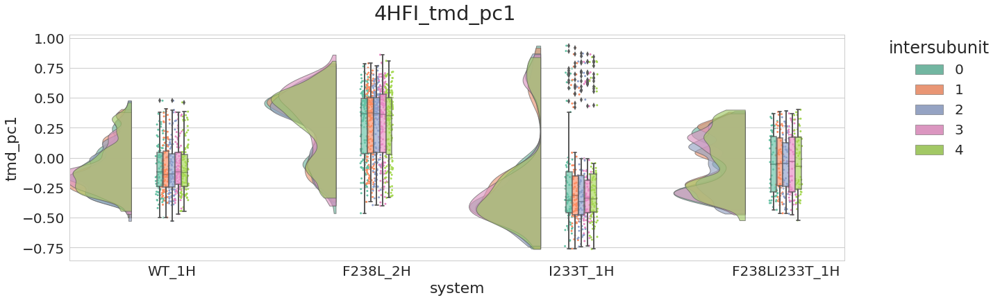

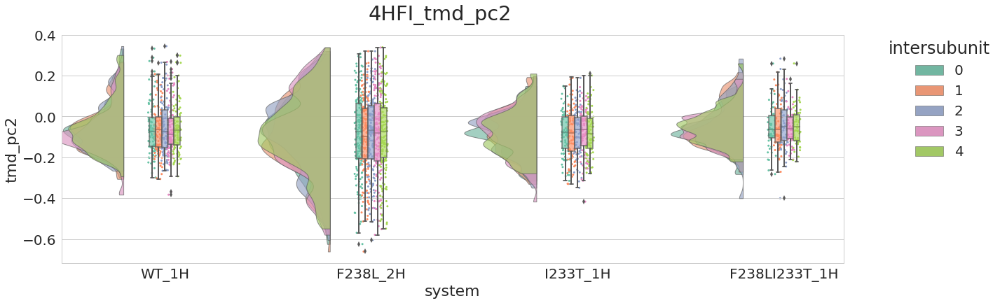

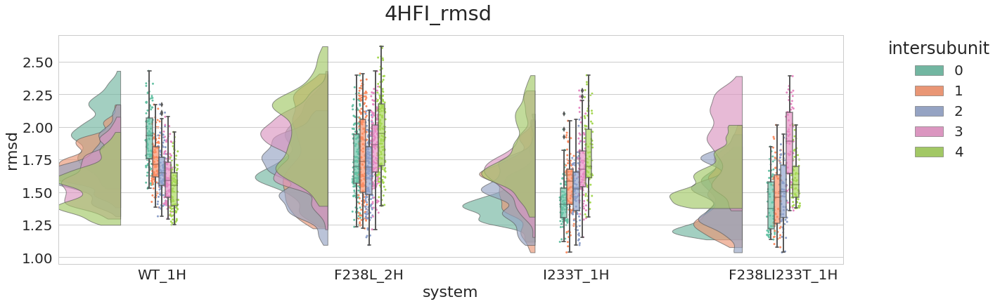

...

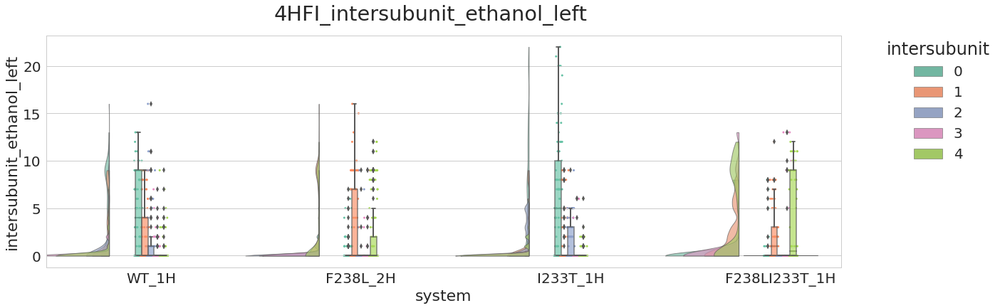

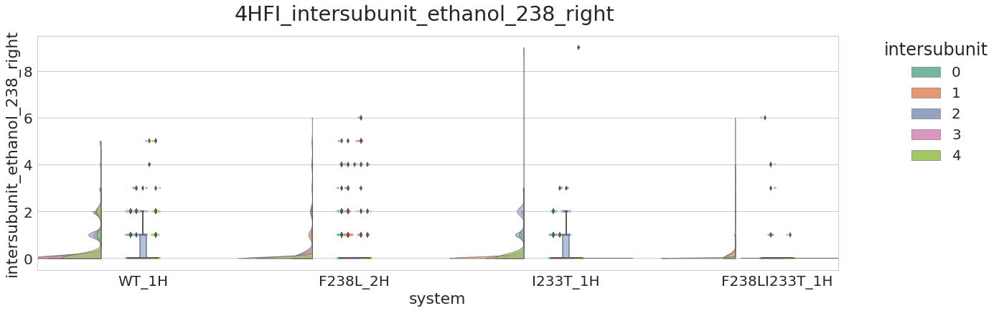

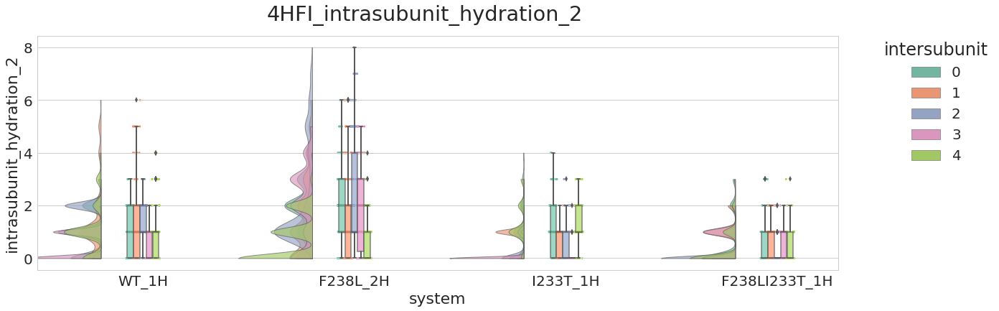

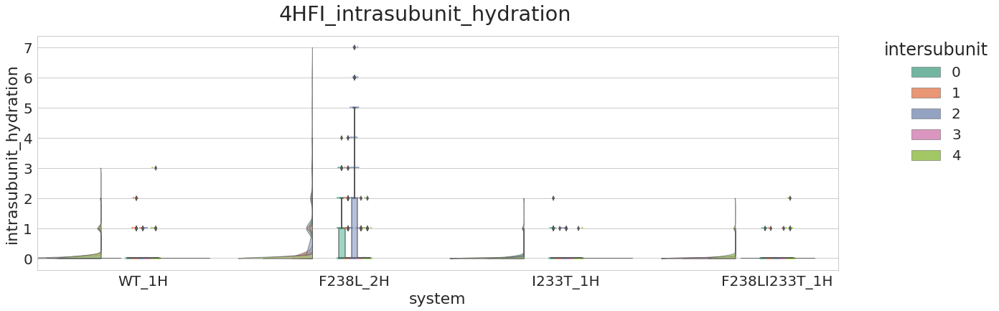

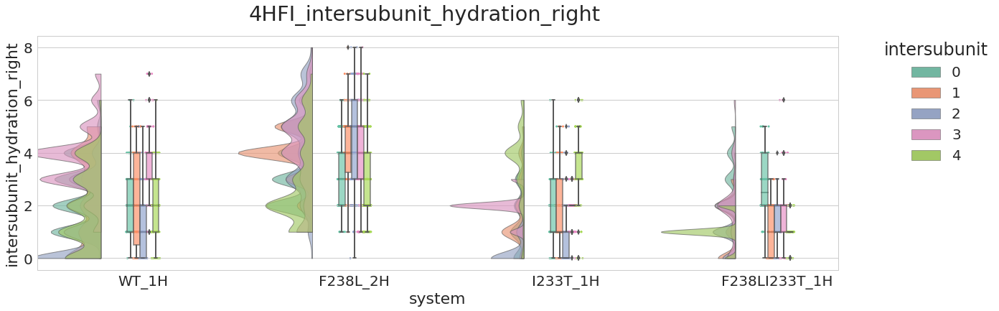

In [234]:
for feature in md_data.columns[6:]:
    fig, ax = plt.subplots(figsize=(20, 6))
    fig.suptitle('4HFI_' + feature)
    pt.RainCloud(x = 'system', y = feature, hue='intersubunit',data = md_data[md_data.traj_time>40],  
        palette = 'Set2', bw = .2,width_viol = .7,ax=ax,alpha = .65,dodge = True,pointplot=False)
#    group = md_data_235.groupby(['system'],sort=False)[feature]
#    mean = group.mean()
#    errors = group.sem()
#    mean.plot.bar(yerr=errors,ax=ax)
    ax.set_xticklabels(['WT_1H','F238L_2H','I233T_1H','F238LI233T_1H','FL_2H'])


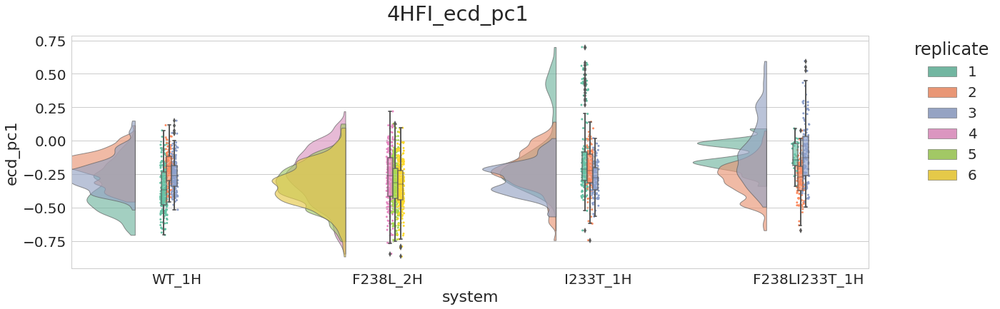

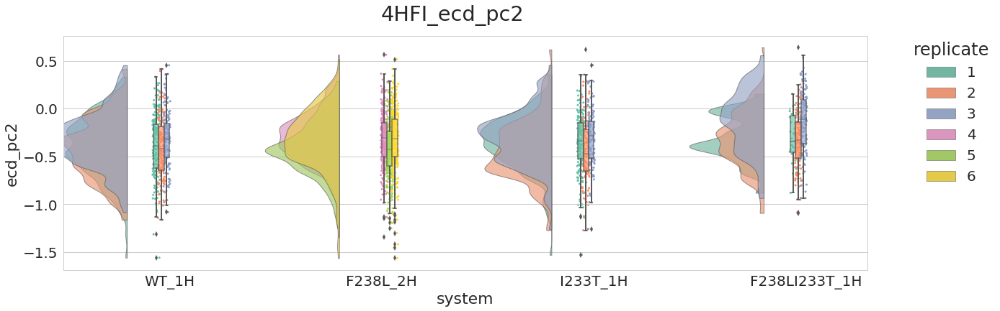

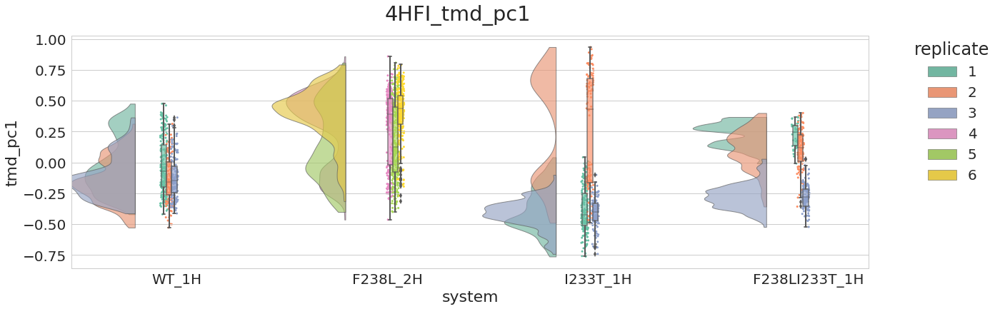

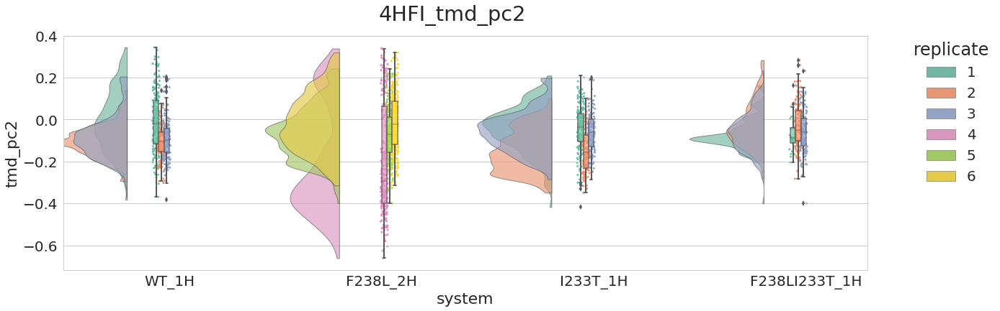

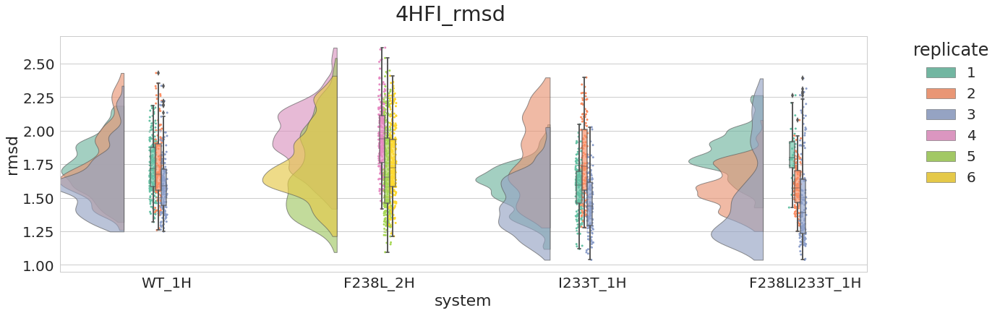

...

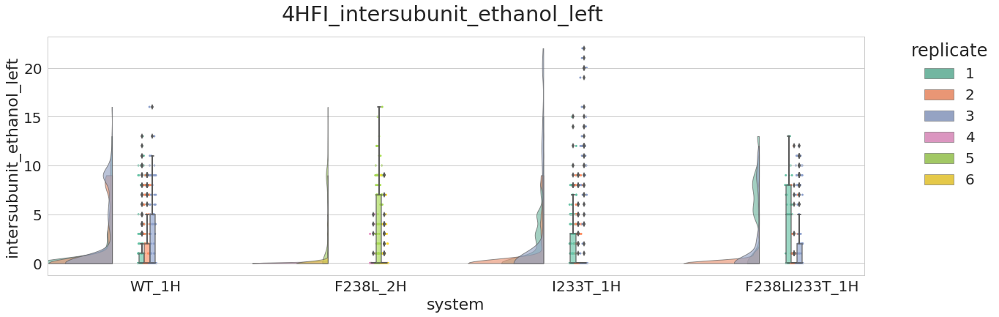

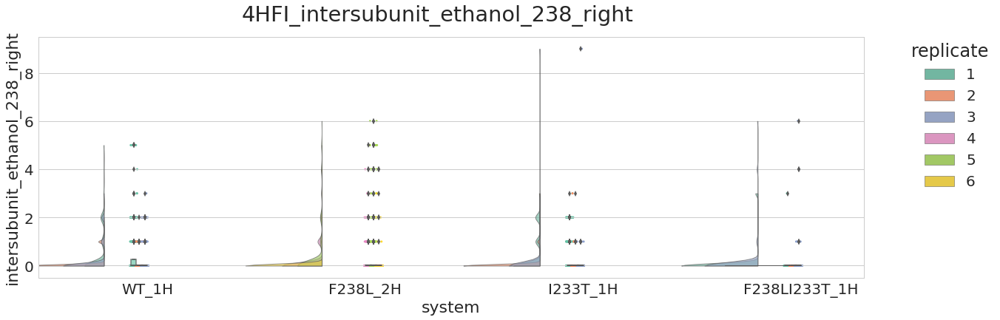

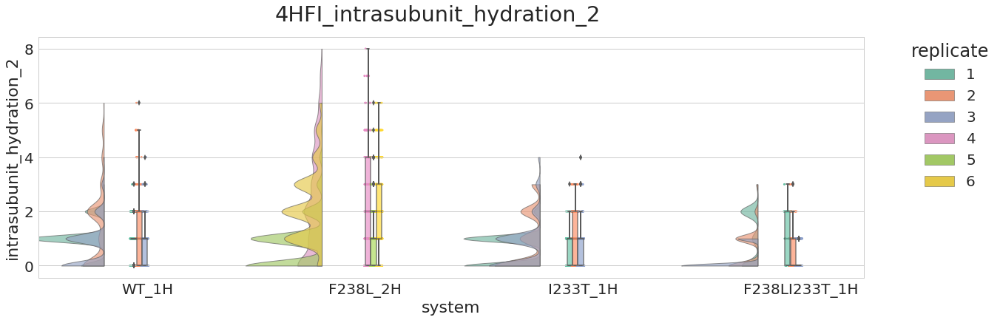

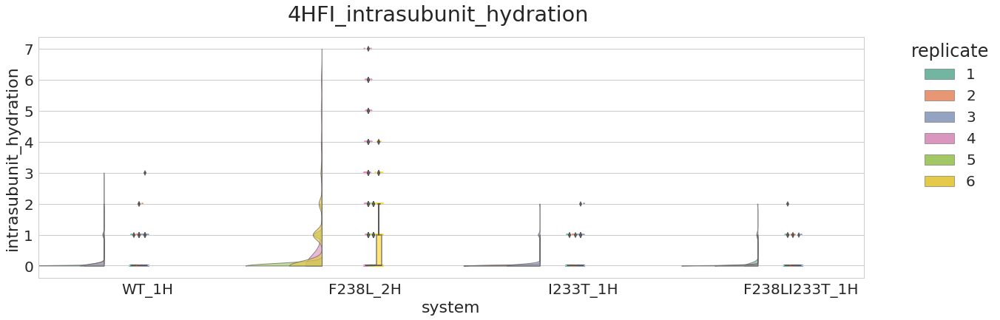

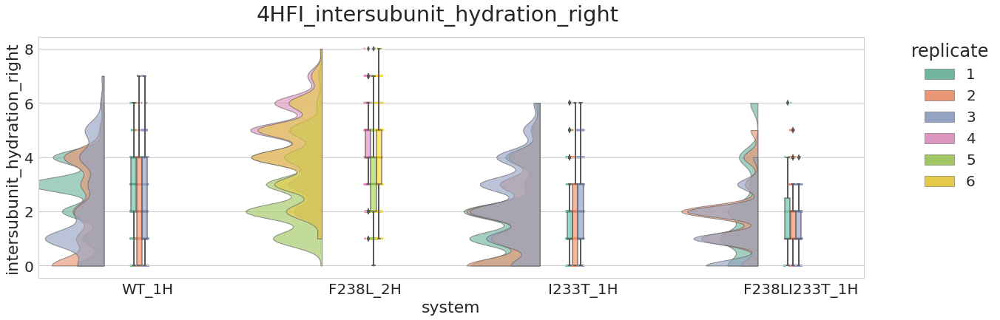

In [235]:
for feature in md_data.columns[6:]:
    fig, ax = plt.subplots(figsize=(20, 6))
    fig.suptitle('4HFI_' + feature)
    pt.RainCloud(x = 'system', y = feature, hue='replicate',data = md_data[md_data.traj_time>40],  
        palette = 'Set2', bw = .2,width_viol = .7,ax=ax,alpha = .65,dodge = True)
#    group = md_data_235.groupby(['system'],sort=False)[feature]
#    mean = group.mean()
#    errors = group.sem()
#    mean.plot.bar(yerr=errors,ax=ax)
    ax.set_xticklabels(['WT_1H','F238L_2H','I233T_1H','F238LI233T_1H','FL_2H'])


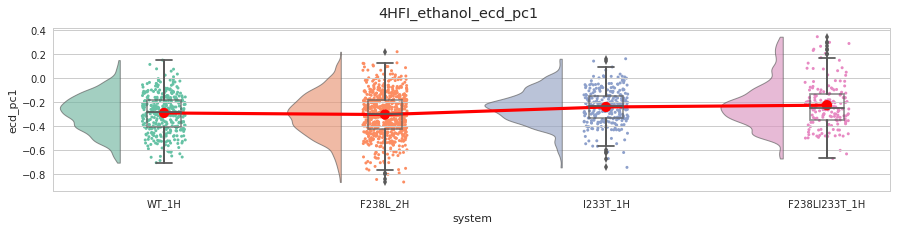

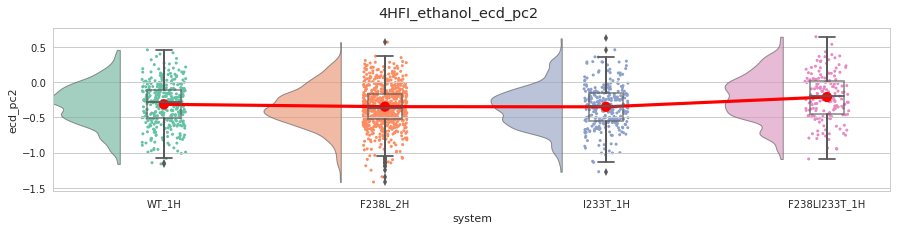

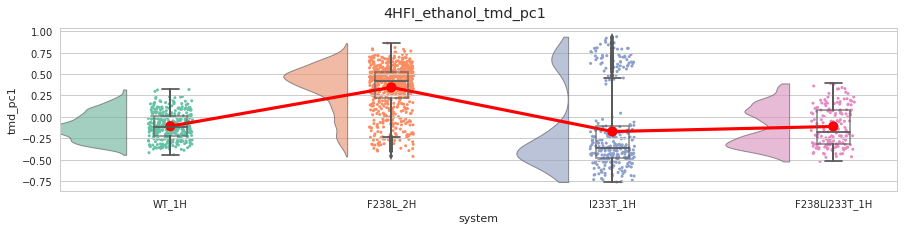

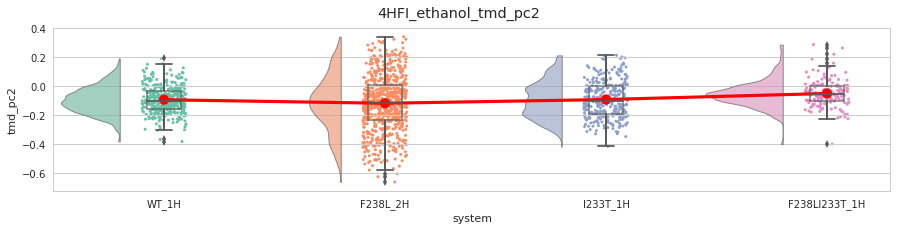

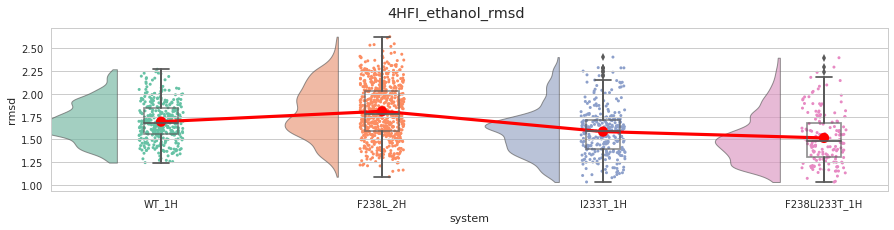

...

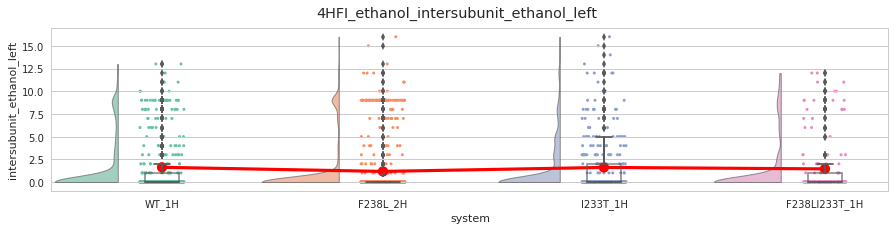

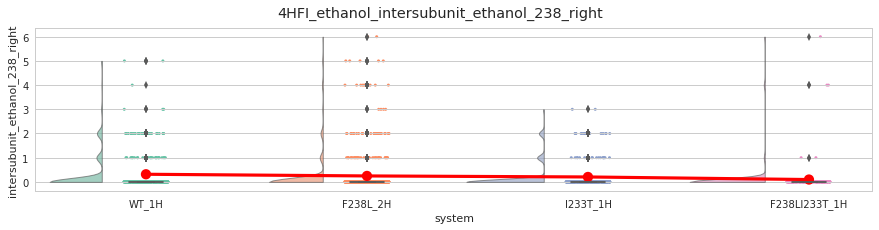

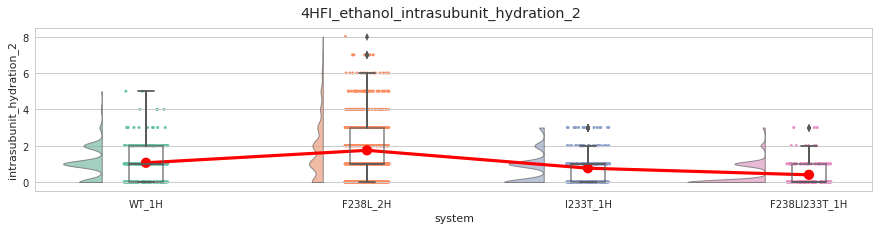

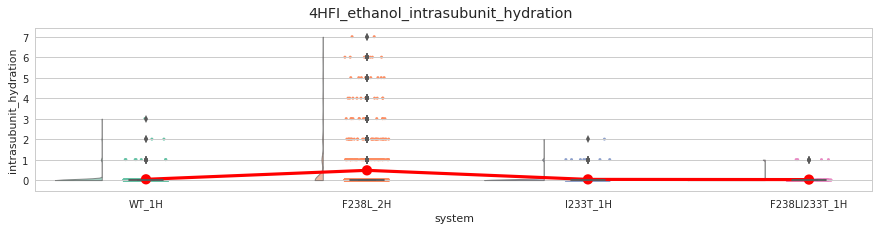

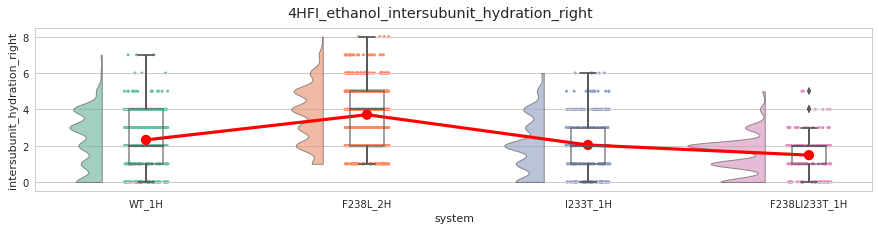

In [286]:
for feature in md_data.columns[6:]:
    fig, ax = plt.subplots(figsize=(15, 3))
    fig.suptitle('4HFI_ethanol_' + feature)
    pt.RainCloud(x = 'system', y = feature, data = md_data[md_data.traj_time>50],  
        palette = 'Set2', bw = .2,width_viol = .7,ax=ax,alpha = .65,dodge = True,pointplot=True)
#    group = md_data_235.groupby(['system'],sort=False)[feature]
#    mean = group.mean()
#    errors = group.sem()
#    mean.plot.bar(yerr=errors,ax=ax)
    ax.set_xticklabels(['WT_1H','F238L_2H','I233T_1H','F238LI233T_1H','FL_2H'])


In [244]:
traj_notes =  [
              '4HFI_pH46_md4','4HFI_pH46_md5','4HFI_pH46_md6',
        '4HFI_pH46_md7','4HFI_pH46_md8','4HFI_pH46_md9',
                '4HFI_F238L_pH46_md7','4HFI_F238L_pH46_md8','4HFI_F238L_pH46_md9',
        '4HFI_F238L_pH46_md4','4HFI_F238L_pH46_md5','4HFI_F238L_pH46_md6',
              '4HFI_I233T_pH46_md4','4HFI_I233T_pH46_md5','4HFI_I233T_pH46_md6',
        '4HFI_I233T_pH46_md7','4HFI_I233T_pH46_md8','4HFI_I233T_pH46_md9',
                '4HFI_F238LI233T_pH46_md4','4HFI_F238LI233T_pH46_md5','4HFI_F238LI233T_pH46_md6',
            '4HFI_F238LI233T_pH46_md7','4HFI_F238LI233T_pH46_md8','4HFI_F238LI233T_pH46_md9']


In [245]:
notation_changer = ['4HFI_pH46_md4', '4HFI_pH46_md7','4HFI_F238L_pH46_md7','4HFI_F238L_pH46_md4',
                '4HFI_I233T_pH46_md4','4HFI_I233T_pH46_md7','4HFI_F238LI233T_pH46_md4','4HFI_F238LI233T_pH46_md7']

In [246]:
md_data = create_md_dataframe()
create_metadata(md_data)
create_system_notation(md_data)
create_cppca_data(md_data)

In 4HFI_pH46_md4, simulation runs 1160 ns.
In 4HFI_pH46_md5, simulation runs 1020 ns.
In 4HFI_pH46_md6, simulation runs 1110 ns.
In 4HFI_pH46_md7, simulation runs 1040 ns.
In 4HFI_pH46_md8, simulation runs 1150 ns.
In 4HFI_pH46_md9, simulation runs 1110 ns.
In 4HFI_F238L_pH46_md7, simulation runs 1020 ns.
In 4HFI_F238L_pH46_md8, simulation runs 1050 ns.
In 4HFI_F238L_pH46_md9, simulation runs 1100 ns.
In 4HFI_F238L_pH46_md4, simulation runs 1510 ns.
In 4HFI_F238L_pH46_md5, simulation runs 1100 ns.
In 4HFI_F238L_pH46_md6, simulation runs 1130 ns.
In 4HFI_I233T_pH46_md4, simulation runs 500 ns.
In 4HFI_I233T_pH46_md5, simulation runs 870 ns.
In 4HFI_I233T_pH46_md6, simulation runs 850 ns.
In 4HFI_I233T_pH46_md7, simulation runs 890 ns.
In 4HFI_I233T_pH46_md8, simulation runs 900 ns.
In 4HFI_I233T_pH46_md9, simulation runs 830 ns.
In 4HFI_F238LI233T_pH46_md4, simulation runs 1080 ns.
In 4HFI_F238LI233T_pH46_md5, simulation runs 870 ns.
In 4HFI_F238LI233T_pH46_md6, simulation runs 820 ns.


In [247]:
create_rmsd_data(md_data)
create_helix_tilt_data(md_data)
create_helix_twist_data(md_data)
create_M2_M1_distance(md_data)
create_M1_kink(md_data)
create_M2_kink(md_data)

In [186]:
create_intersubunit_ethanol_data(md_data)

In [202]:
create_intersubunit_ethanol_data_2(md_data)

In [203]:
create_intersubunit_ethanol_data_5(md_data)

In [200]:
create_intrasubunit_ethanol_data(md_data)

In [201]:
create_intrasubunit_ethanol_data_2(md_data)
create_intrasubunit_ethanol_data_3(md_data)

In [248]:
create_intrasubunit_hydration_data_3(md_data)
create_intrasubunit_hydration_data(md_data)
create_intersubunit_hydration_data(md_data)

In [249]:
create_beta_expansion(md_data)

In [273]:
md_data.to_pickle('glic_intersubunit_open_235.pickle')

In [255]:
import seaborn as sns
import ptitprince as pt
sns.set(style="whitegrid",font_scale=1)
import matplotlib.collections as clt

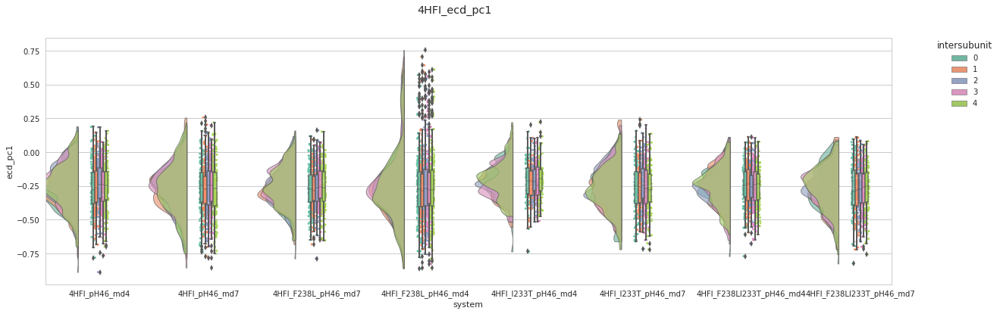

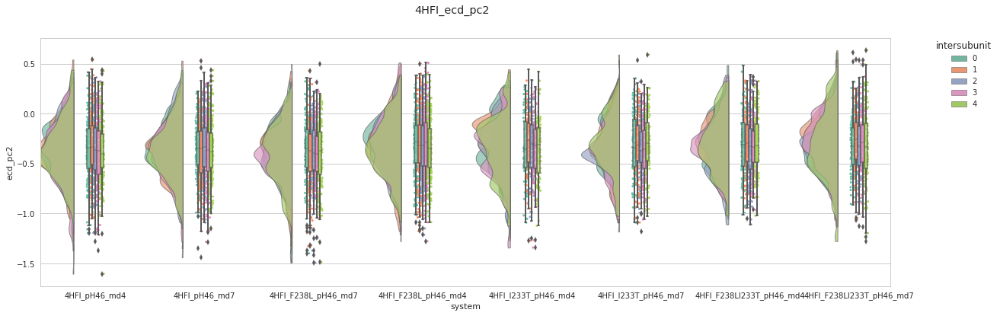

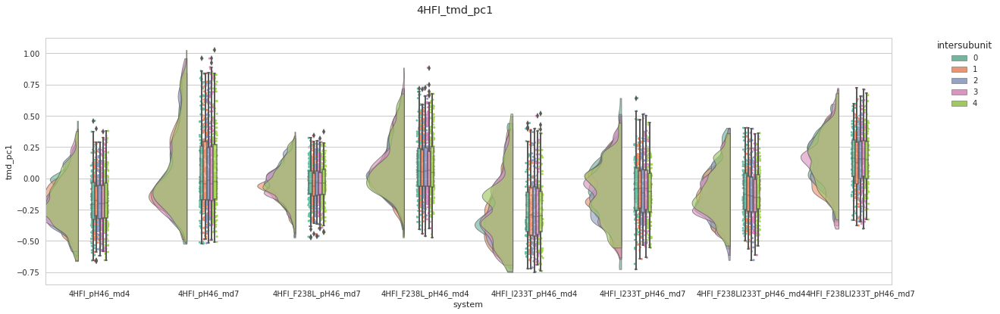

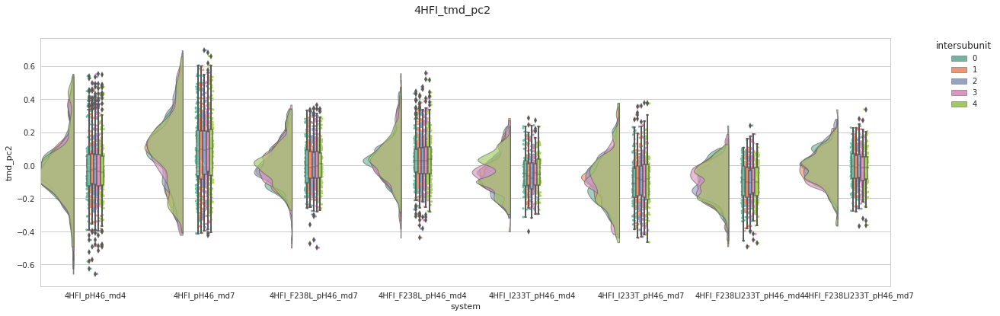

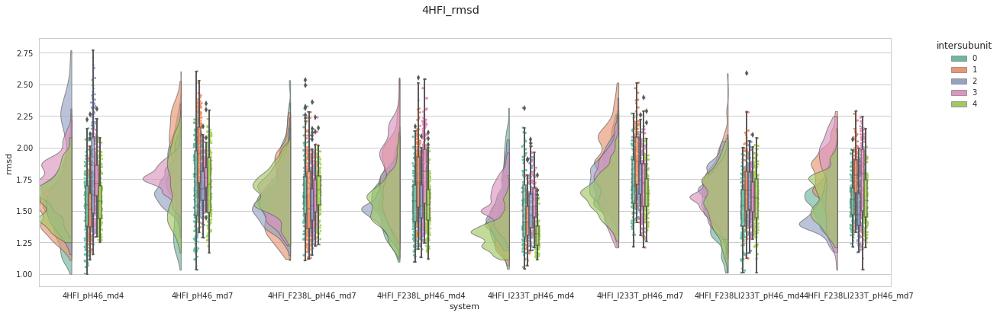

...

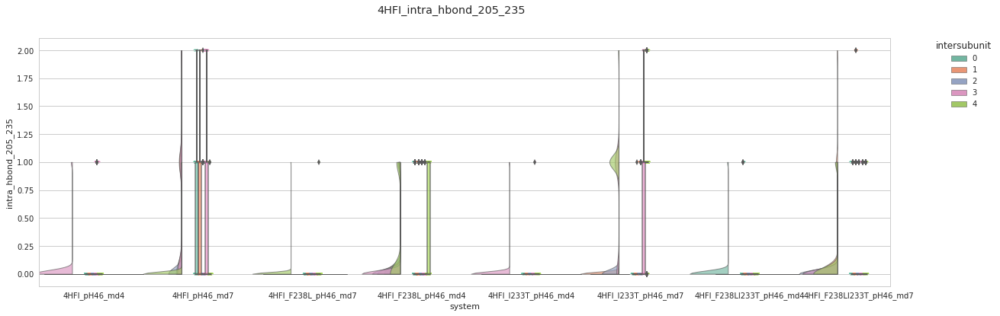

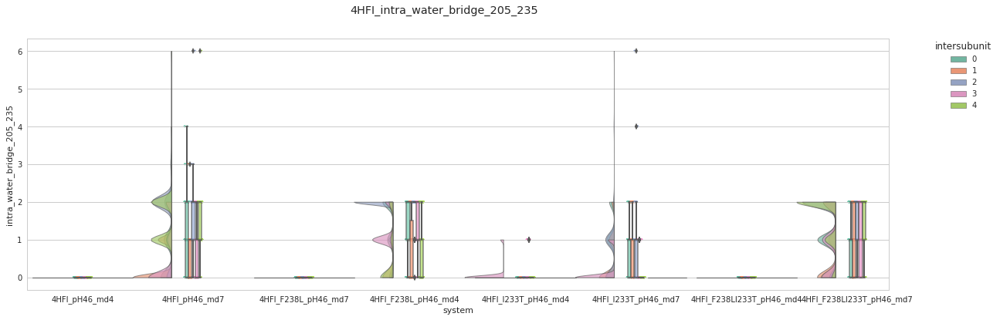

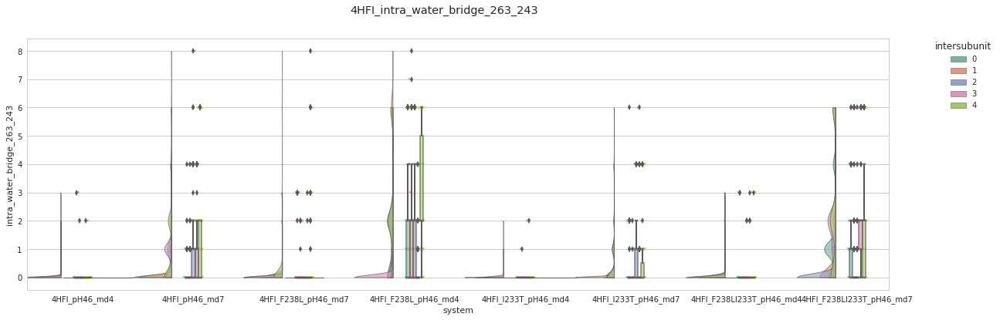

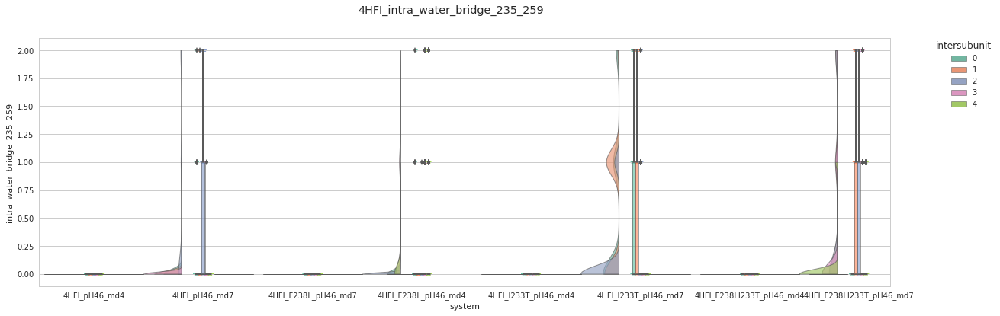

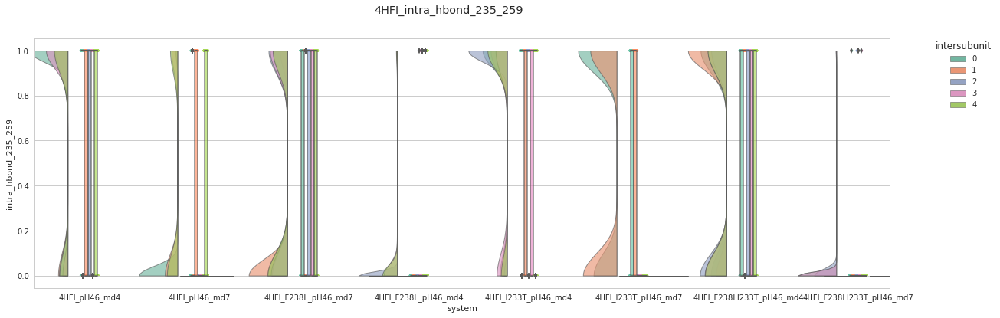

In [274]:
for feature in md_data.columns[6:]:
    fig, ax = plt.subplots(figsize=(20, 6))
    fig.suptitle('4HFI_' + feature)
    pt.RainCloud(x = 'system', y = feature, hue='intersubunit',data = md_data[md_data.traj_time>40],  
        palette = 'Set2', bw = .2,width_viol = .7,ax=ax,alpha = .65,dodge = True,pointplot=False)
#    group = md_data_235.groupby(['system'],sort=False)[feature]
#    mean = group.mean()
#    errors = group.sem()
#    mean.plot.bar(yerr=errors,ax=ax)
    ax.set_xticklabels(notation_changer)


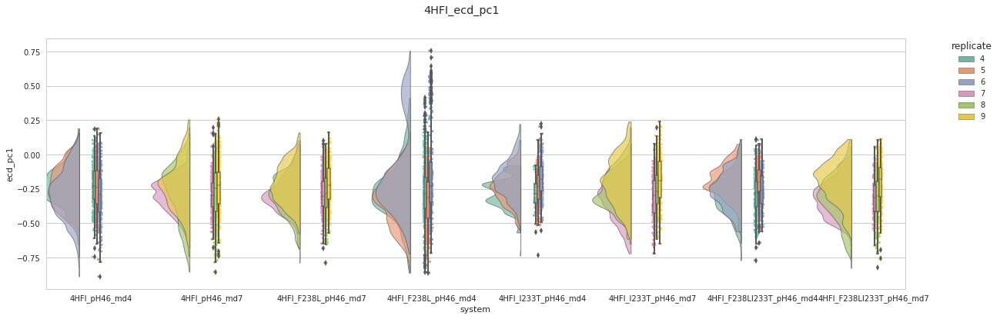

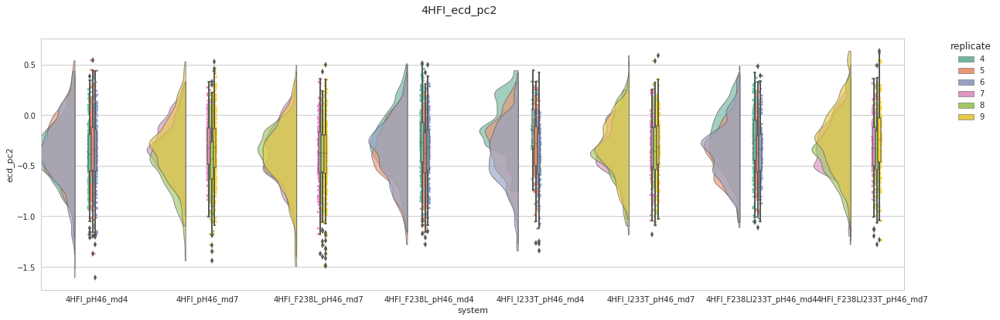

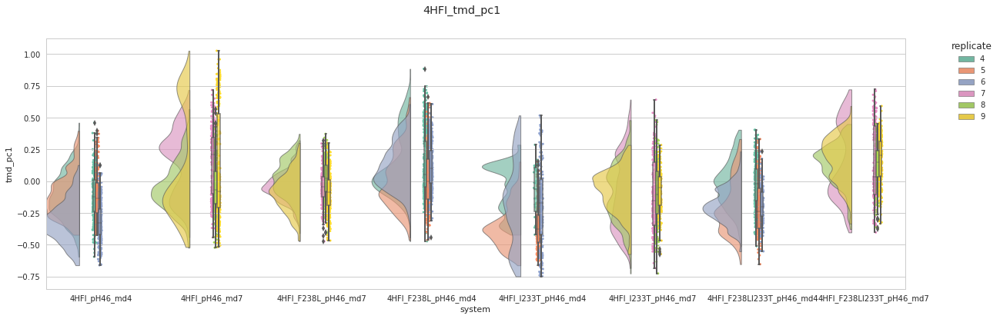

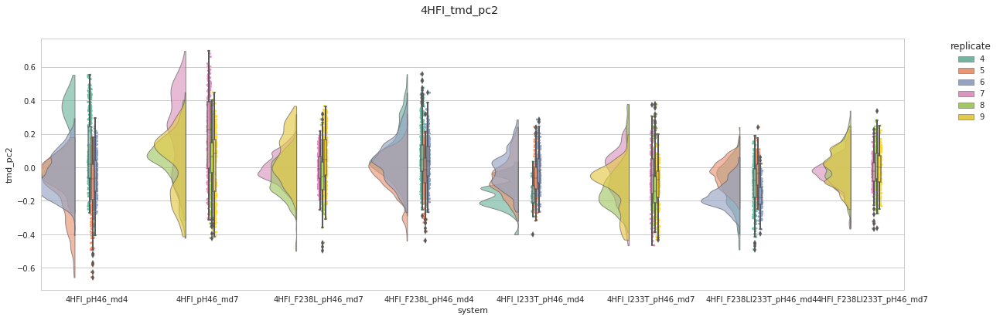

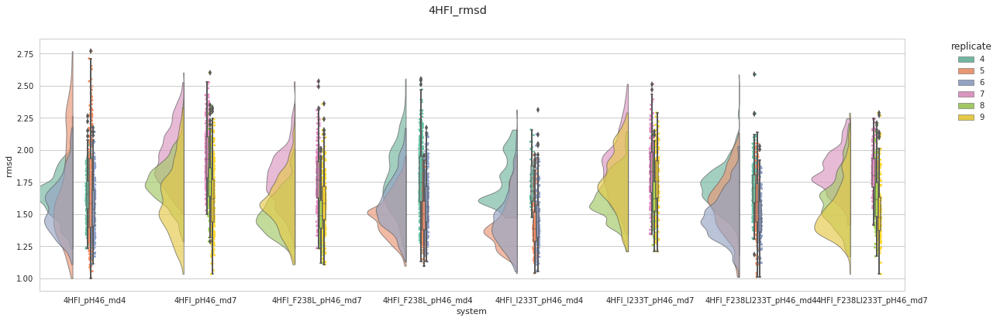

...

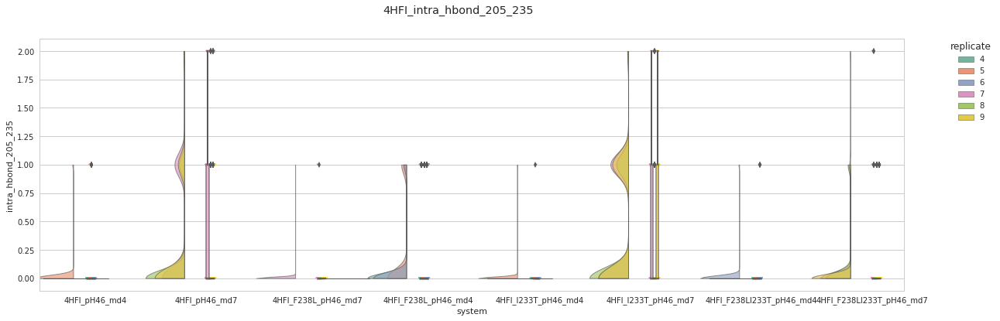

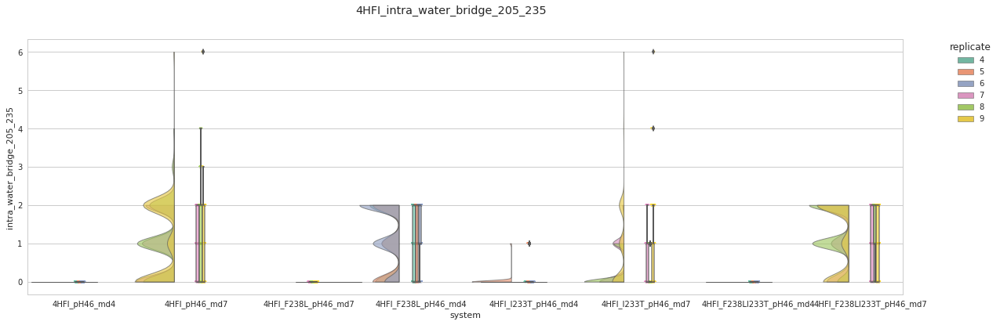

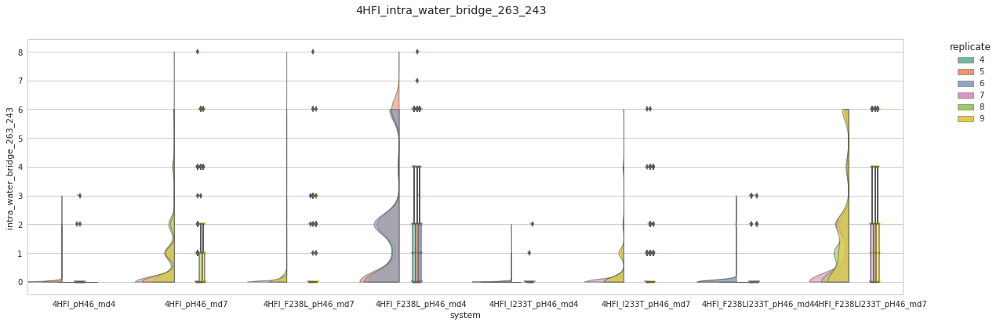

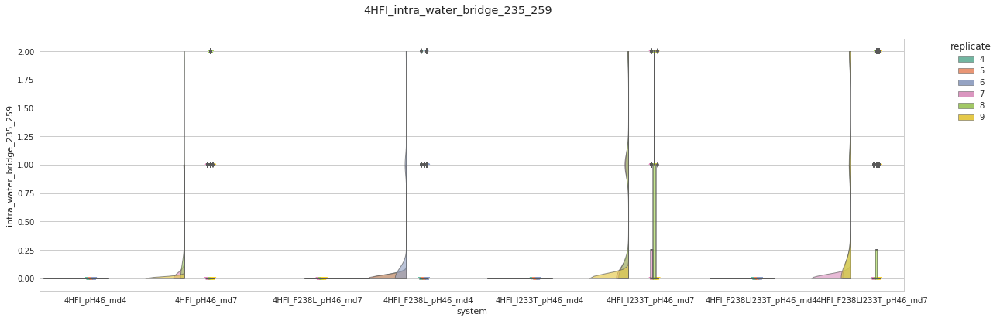

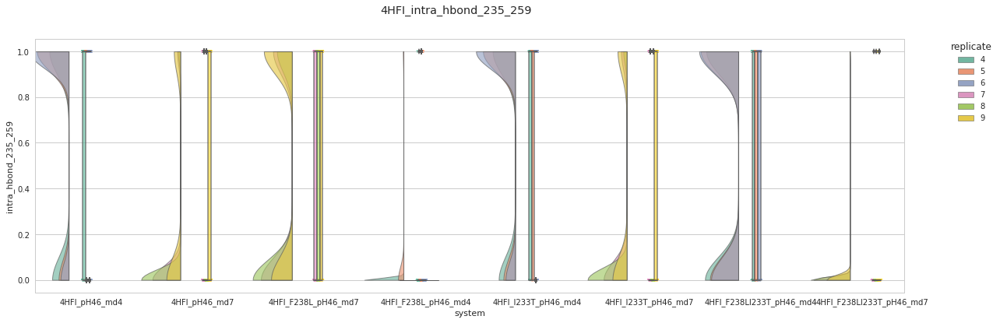

In [275]:
for feature in md_data.columns[6:]:
    fig, ax = plt.subplots(figsize=(20, 6))
    fig.suptitle('4HFI_' + feature)
    pt.RainCloud(x = 'system', y = feature, hue='replicate',data = md_data[md_data.traj_time>40],  
        palette = 'Set2', bw = .2,width_viol = .7,ax=ax,alpha = .65,dodge = True)
#    group = md_data_235.groupby(['system'],sort=False)[feature]
#    mean = group.mean()
#    errors = group.sem()
#    mean.plot.bar(yerr=errors,ax=ax)
    ax.set_xticklabels(notation_changer)


In [237]:
md_data_235_subunit = pd.read_pickle('glic_activation_subunit_open.pickle')

In [147]:
md_data_open.to_pickle('glic_activation_subunit_open.pickle')

In [140]:
md_data_open = md_data_2[md_data_2.system.isin(range(13,21))]

In [112]:
md_data_2 = pd.read_pickle('glic_activation_subunit.pickle')

In [115]:
md_data_2_close = md_data_2[md_data_2.system.isin([8,9,10,11])]

In [ ]:
md_data_2_oepn = md_data_2[md_data_2.system.isin([13,15,16,18])]

In [162]:
traj_notes = ['5NJY_pH70_md1','5NJY_pH70_md2','5NJY_pH70_md3',
              '5NJY_F238L_pH70_md1','5NJY_F238L_pH70_md2','5NJY_F238L_pH70_md3',
              '5NJY_I233T_pH70_md4','5NJY_I233T_pH70_md2','5NJY_I233T_pH70_md3',
              '5NJY_F238LI233T_pH70_md1','5NJY_F238LI233T_pH70_md2','5NJY_F238LI233T_pH70_md3',
              '5NJY_pH46_md1','5NJY_pH46_md2','5NJY_pH46_md3',
              '5NJY_F238L_pH46_md1','5NJY_F238L_pH46_md2','5NJY_F238L_pH46_md3',
              '5NJY_I233T_pH46_md1','5NJY_I233T_pH46_md2','5NJY_I233T_pH46_md3',
              '5NJY_F238LI233T_pH46_md1','5NJY_F238LI233T_pH46_md2','5NJY_F238LI233T_pH46_md3']

In [163]:
def create_Hbond_data(traj_note, location = default_location, skip = default_skip):
    hbond_data = pd.read_csv(location + traj_note + '/hbond_tmd.csv')
    water_bridge_data = pd.read_csv(location + traj_note + '/water_bridge_tmd.csv')
    top_location = traj_note + '/' + traj_note + ".system.pdb"
    traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
    traj = md.load(location + traj_location,top = location + top_location)
    topology = traj.topology
    table, bonds = topology.to_dataframe()
    n_frames = traj.n_frames
    for resid in range(198,315):
        hbond_dataframe = pd.DataFrame(columns=list(['traj_time','subunit','resid','counterpart']))
        water_bridge_dataframe = pd.DataFrame(columns=list(['traj_time','subunit','resid','counterpart']))   
        for time in range(0,n_frames*10000,10000):  
            
            # Gather acceptor_list donor_list data
            
            hbond_donor = hbond_data[(hbond_data['time'] == time ) & (hbond_data['donor_resid'] == resid)]
            n_donor_hbond = len(hbond_donor)
            acceptor_list = []
            for donor_ind in sorted(set(hbond_donor['donor_index'])):
                acceptor_list.append([donor_ind,hbond_donor[hbond_donor['donor_index'] == donor_ind].iloc[:,3:4].values.T.tolist()[0]])
                
            hbond_acceptor = hbond_data[(hbond_data['time'] == time) & (hbond_data['acceptor_resid'] == resid)]
            n_acceptor_hbond = len(hbond_acceptor)
            donor_list = []
            for acceptor_ind in sorted(set(hbond_acceptor['acceptor_index'])):
                donor_list.append([acceptor_ind,hbond_acceptor[hbond_acceptor['acceptor_index'] == acceptor_ind].iloc[:,2:3].values.T.tolist()[0]])
                
            for hbond_pair in donor_list + acceptor_list:
                if (table.loc[hbond_pair[0]].resName != 'HOH') & (table.loc[hbond_pair[0]].resName != 'CL') & (table.loc[hbond_pair[0]].resName != 'NA') & (table.loc[hbond_pair[0]].resName != 'POP'):
                    hbond_counterparts = []
                    for hbond_counterpart in hbond_pair[1]:
                        if (table.loc[hbond_counterpart].resName != 'HOH') & (table.loc[hbond_counterpart].resName != 'CL') & (table.loc[hbond_counterpart].resName != 'NA') & (table.loc[hbond_counterpart].resName != 'POP'):
                            hbond_counterparts.append(hbond_counterpart)
                    hbond_dataframe = hbond_dataframe.append({'traj_time':time,'subunit':table.loc[hbond_pair[0]]['chainID'],'resid': hbond_pair[0], 'counterpart': hbond_counterparts},ignore_index=True)
                
            # Analyze percentage
           
            water_bridge_donor = water_bridge_data[(water_bridge_data['time'] == time) & (water_bridge_data['donor_resid'] == resid)]
            acceptor_list = []
            if not(water_bridge_donor.empty):
                for donor_ind in sorted(set(water_bridge_donor['donor_index'])):
                    for water_resid in set(water_bridge_donor[water_bridge_donor['donor_index'] == donor_ind]['acceptor_resid']):
                        acceptor_list.append([donor_ind,water_bridge_data[(water_bridge_data['time'] == time) & (water_bridge_data['acceptor_resid'] == water_resid) & (water_bridge_data['donor_resid'] != resid)].iloc[:,2:3].values.flatten().tolist()])
                        acceptor_list.append([donor_ind,water_bridge_data[(water_bridge_data['time'] == time) & (water_bridge_data['donor_resid'] == water_resid) & (water_bridge_data['donor_resid'] != resid)].iloc[:,3:4].values.flatten().tolist()])
            water_bridge_acceptor = water_bridge_data[(water_bridge_data['time'] == time) & (water_bridge_data['acceptor_resid'] == resid)]
            donor_list = []
            if not(water_bridge_acceptor.empty):
                for acceptor_ind in sorted(set(water_bridge_donor['acceptor_index'])):
                    for water_resid in set(water_bridge_donor[water_bridge_donor['acceptor_index'] == acceptor_ind]['donor_resid']):
                        donor_list.append([donor_ind,water_bridge_data[(water_bridge_data['time'] == time) & (water_bridge_data['acceptor_resid'] == water_resid) & (water_bridge_data['acceptor_resid'] != resid)].iloc[:,2:3].values.flatten().tolist()])
                        donor_list.append([donor_ind,water_bridge_data[(water_bridge_data['time'] == time) & (water_bridge_data['donor_resid'] == water_resid) & (water_bridge_data['acceptor_resid'] != resid)].iloc[:,3:4].values.flatten().tolist()])
            for w_bridge_pair in acceptor_list + donor_list:
                if (table.loc[w_bridge_pair[0]].resName != 'HOH') & (table.loc[w_bridge_pair[0]].resName != 'CL') & (table.loc[w_bridge_pair[0]].resName != 'NA') & (table.loc[w_bridge_pair[0]].resName != 'POP'):
                    if w_bridge_pair[1] == []:
                        water_bridge_dataframe = water_bridge_dataframe.append({'traj_time':time,'subunit':table.loc[w_bridge_pair[0]]['chainID'],'resid': w_bridge_pair[0], 'counterpart': [w_bridge_pair[0]]},ignore_index=True)
                    else:
                        water_bridgecounterparts = []
                        for water_bridge_counterpart in w_bridge_pair[1]:
                            if (table.loc[water_bridge_counterpart].resName != 'HOH') & (table.loc[water_bridge_counterpart].resName != 'CL') & (table.loc[water_bridge_counterpart].resName != 'NA') & (table.loc[water_bridge_counterpart].resName != 'POP'):
                                water_bridgecounterparts.append(water_bridge_counterpart)
                            water_bridge_dataframe = water_bridge_dataframe.append({'traj_time':time,'subunit':table.loc[w_bridge_pair[0]]['chainID'],'resid': w_bridge_pair[0], 'counterpart': water_bridgecounterparts},ignore_index=True)


        hbond_dataframe.to_csv(location + traj_note + '/hbond_analysis/' + str(resid) + '_hbond_list_subunit.csv' )
        water_bridge_dataframe.to_csv(location + traj_note + '/hbond_analysis/' + str(resid) + '_water_bridge_list_subunit.csv')
    print('finishing!')
   #         print('At time ' + str(time) + ', in total ' + str(n_hbond) + ' hydrogen bonds between residues, resid '
   #               + str(resid) + ' forms ' + str(n_intra_hbond) + ' intra-subunit H-bond and ' + str(n_inter_hbond) + ' inter-subunit H-bond.')

In [164]:
from joblib import Parallel, delayed
import multiprocessing
num_cores = multiprocessing.cpu_count()
Parallel(n_jobs=num_cores)(delayed(create_Hbond_data)(traj_note) for traj_note in traj_notes)

finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!
finishing!


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [6]:
md_data_FL =pd.read_pickle('glic_activation_FL_235.pickle')

In [287]:
traj_notes =  [              '4HFI_pH46_md4','4HFI_pH46_md5','4HFI_pH46_md6',

              '4HFI_pH46_ethanol_md1','4HFI_pH46_ethanol_md2','4HFI_pH46_ethanol_md3',
        '4HFI_F238L_pH46_md4','4HFI_F238L_pH46_md5','4HFI_F238L_pH46_md6',

                '4HFI_F238L_pH46_ethanol_md4','4HFI_F238L_pH46_ethanol_md5','4HFI_F238L_pH46_ethanol_md6',
                             '4HFI_I233T_pH46_md4','4HFI_I233T_pH46_md5','4HFI_I233T_pH46_md6',

              '4HFI_I233T_pH46_ethanol_md1','4HFI_I233T_pH46_ethanol_md2','4HFI_I233T_pH46_ethanol_md3',
                               '4HFI_F238LI233T_pH46_md4','4HFI_F238LI233T_pH46_md5','4HFI_F238LI233T_pH46_md6',

                '4HFI_F238LI233T_pH46_ethanol_md1','4HFI_F238LI233T_pH46_ethanol_md2','4HFI_F238LI233T_pH46_ethanol_md3']

In [289]:
notation_changer = [              '4HFI_pH46_md4',
              '4HFI_pH46_ethanol_md1',
        '4HFI_F238L_pH46_md4',
                '4HFI_F238L_pH46_ethanol_md4',
                             '4HFI_I233T_pH46_md4',
              '4HFI_I233T_pH46_ethanol_md1',
                               '4HFI_F238LI233T_pH46_md4',
                '4HFI_F238LI233T_pH46_ethanol_md1']

In [290]:
md_data = create_md_dataframe()
create_metadata(md_data)
create_system_notation(md_data)
create_cppca_data(md_data)

In 4HFI_pH46_md4, simulation runs 1160 ns.
In 4HFI_pH46_md5, simulation runs 1020 ns.
In 4HFI_pH46_md6, simulation runs 1110 ns.
In 4HFI_pH46_ethanol_md1, simulation runs 850.0 ns.
In 4HFI_pH46_ethanol_md2, simulation runs 680.0 ns.
In 4HFI_pH46_ethanol_md3, simulation runs 730.0 ns.
In 4HFI_F238L_pH46_md4, simulation runs 1510 ns.
In 4HFI_F238L_pH46_md5, simulation runs 1100 ns.
In 4HFI_F238L_pH46_md6, simulation runs 1130 ns.
In 4HFI_F238L_pH46_ethanol_md4, simulation runs 900.0 ns.
In 4HFI_F238L_pH46_ethanol_md5, simulation runs 1020.0 ns.
In 4HFI_F238L_pH46_ethanol_md6, simulation runs 1010.0 ns.
In 4HFI_I233T_pH46_md4, simulation runs 500 ns.
In 4HFI_I233T_pH46_md5, simulation runs 870 ns.
In 4HFI_I233T_pH46_md6, simulation runs 850 ns.
In 4HFI_I233T_pH46_ethanol_md1, simulation runs 780.0 ns.
In 4HFI_I233T_pH46_ethanol_md2, simulation runs 660.0 ns.
In 4HFI_I233T_pH46_ethanol_md3, simulation runs 680.0 ns.
In 4HFI_F238LI233T_pH46_md4, simulation runs 1080 ns.
In 4HFI_F238LI233T_p

In [291]:
create_rmsd_data(md_data)
create_helix_tilt_data(md_data)
create_helix_twist_data(md_data)
create_M2_M1_distance(md_data)
create_M1_kink(md_data)
create_M2_kink(md_data)

In [292]:
create_beta_expansion(md_data)

In [293]:
create_intersubunit_ethanol_data(md_data)

In [ ]:
create_intersubunit_ethanol_data_2(md_data)

In [295]:
create_intersubunit_ethanol_data_5(md_data)

In [296]:
create_intrasubunit_ethanol_data(md_data)

In [297]:
create_intrasubunit_ethanol_data_2(md_data)
create_intrasubunit_ethanol_data_3(md_data)

In [298]:
create_intrasubunit_hydration_data_3(md_data)
create_intrasubunit_hydration_data(md_data)
create_intersubunit_hydration_data(md_data)

In [299]:
md_data.to_pickle('glic_ethanol_open_compare.pickle')

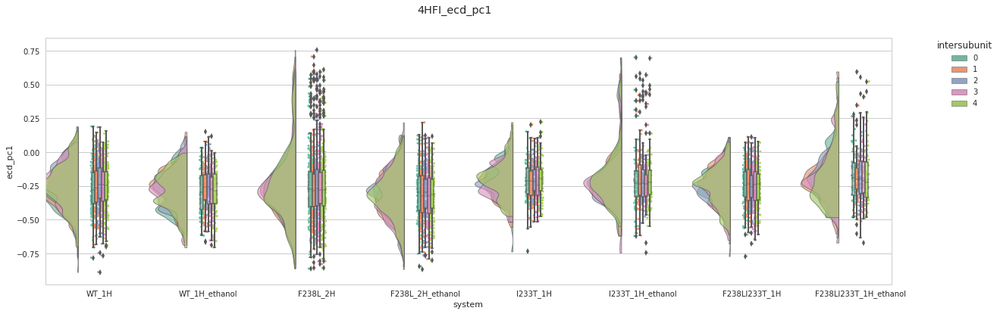

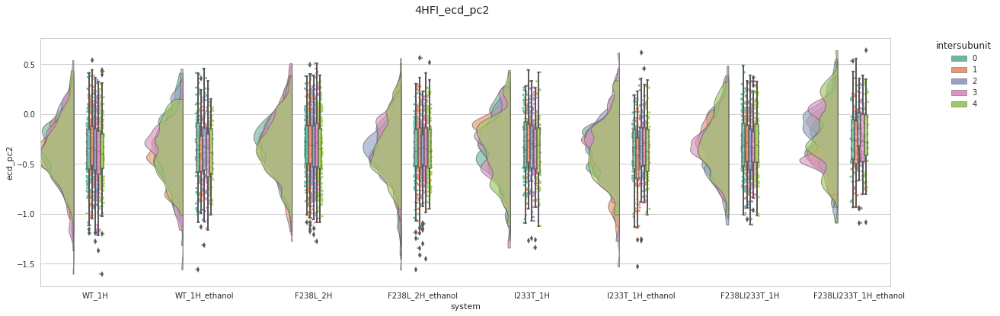

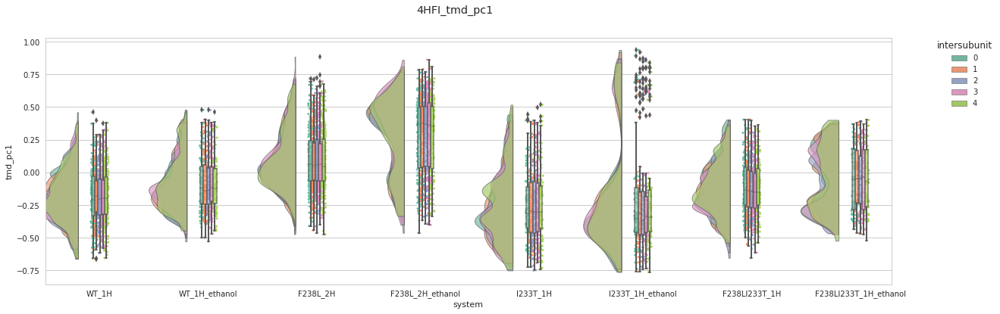

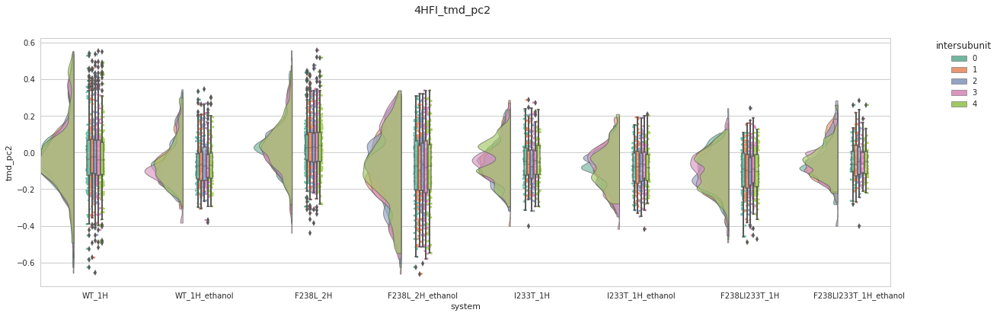

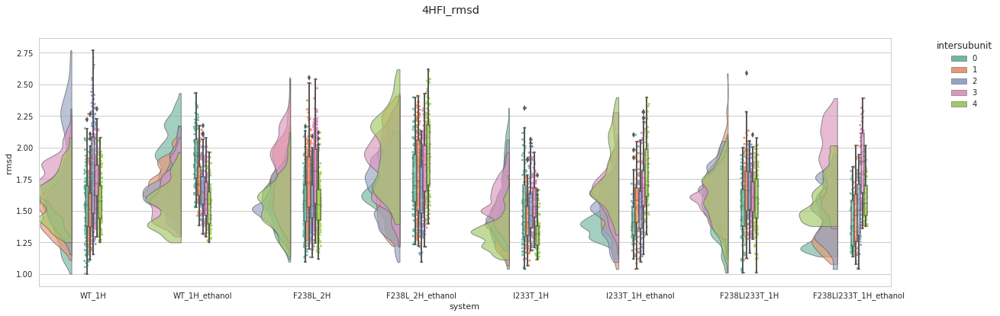

...

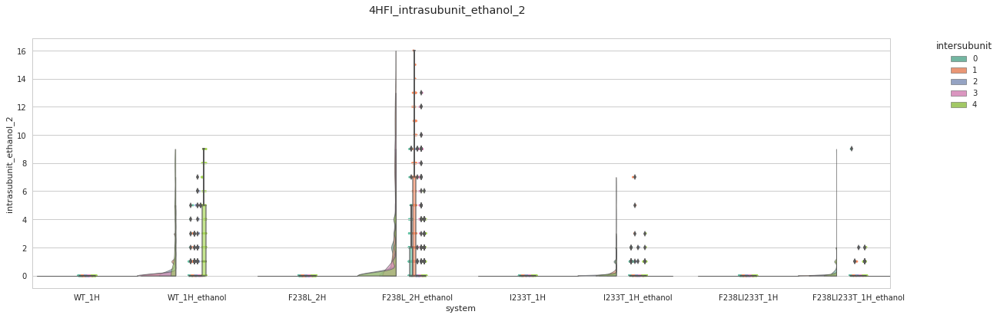

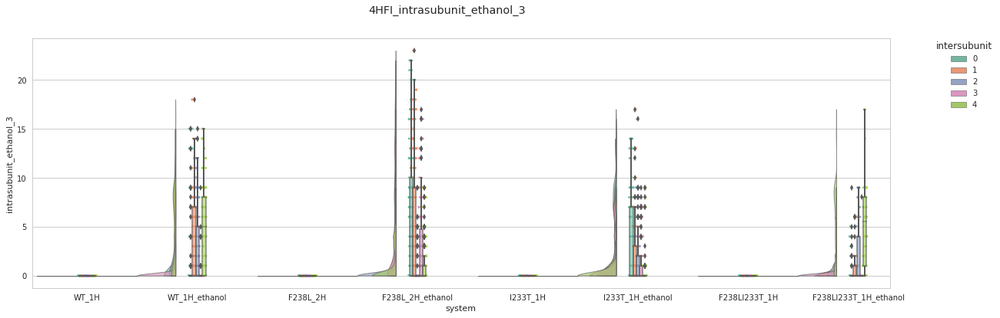

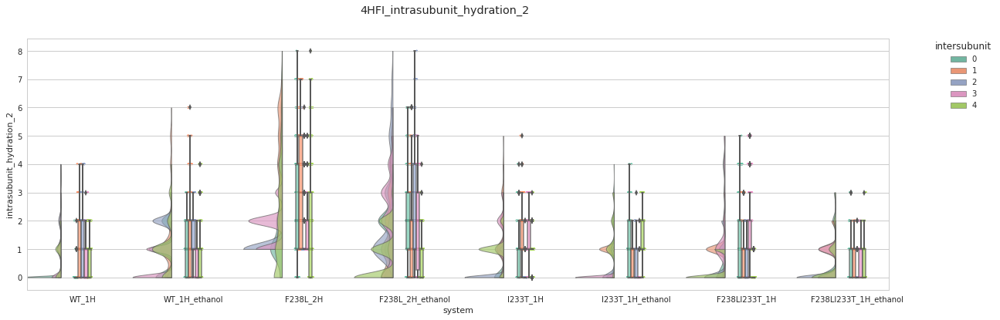

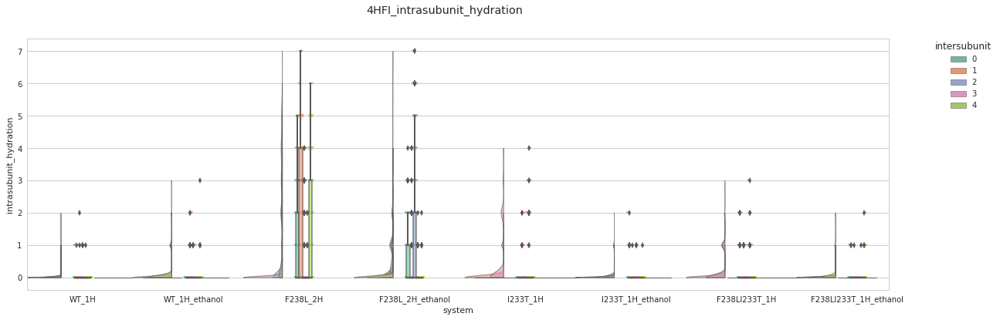

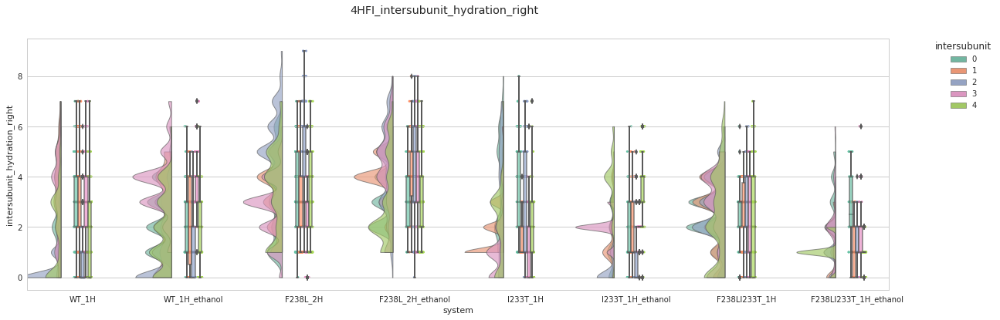

In [307]:
for feature in md_data.columns[6:]:
    fig, ax = plt.subplots(figsize=(20, 6))
    fig.suptitle('4HFI_' + feature)
    pt.RainCloud(x = 'system', y = feature, hue='intersubunit',data = md_data[md_data.traj_time>40],  
        palette = 'Set2', bw = .2,width_viol = .7,ax=ax,alpha = .65,dodge = True,pointplot=False)
#    group = md_data_235.groupby(['system'],sort=False)[feature]
#    mean = group.mean()
#    errors = group.sem()
#    mean.plot.bar(yerr=errors,ax=ax)
    ax.set_xticklabels(['WT_1H','WT_1H_ethanol','F238L_2H','F238L_2H_ethanol','I233T_1H','I233T_1H_ethanol','F238LI233T_1H','F238LI233T_1H_ethanol'])


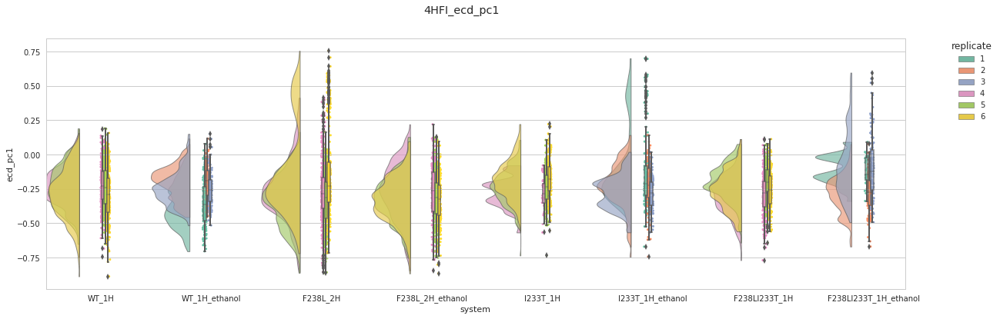

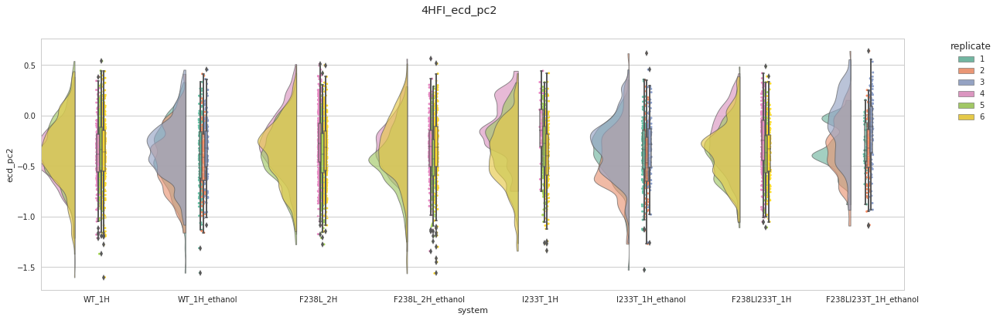

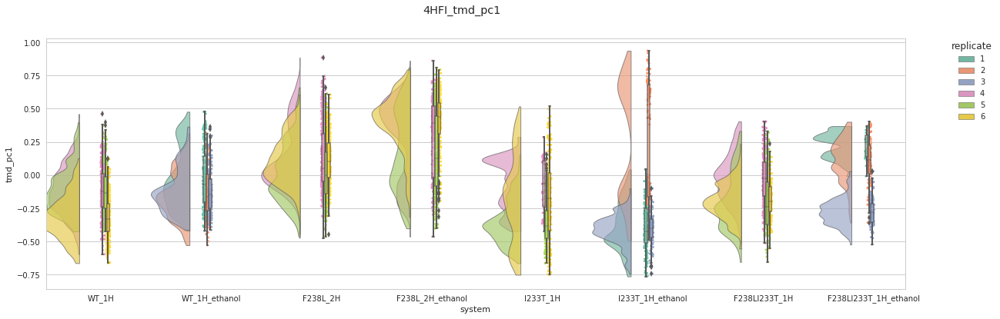

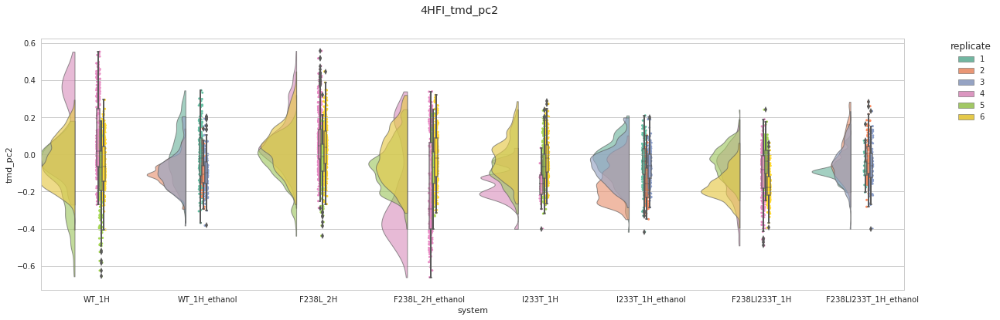

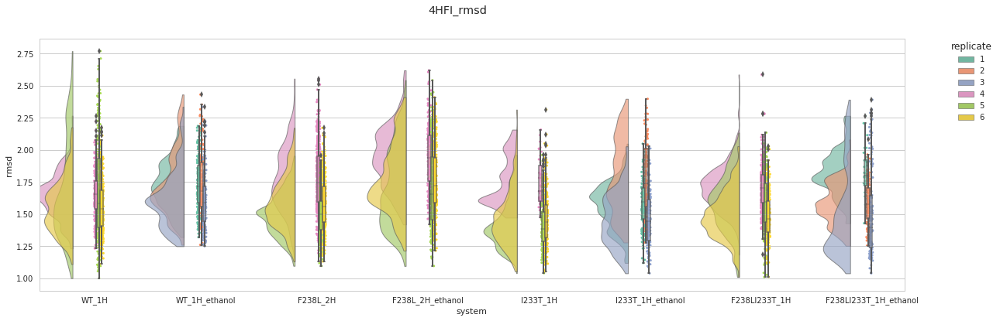

...

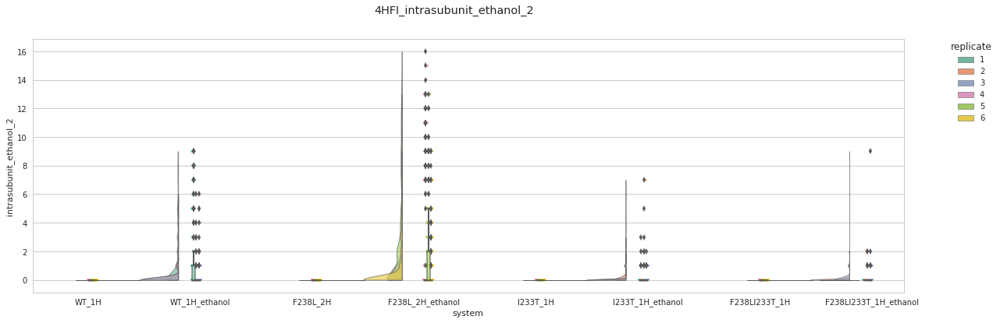

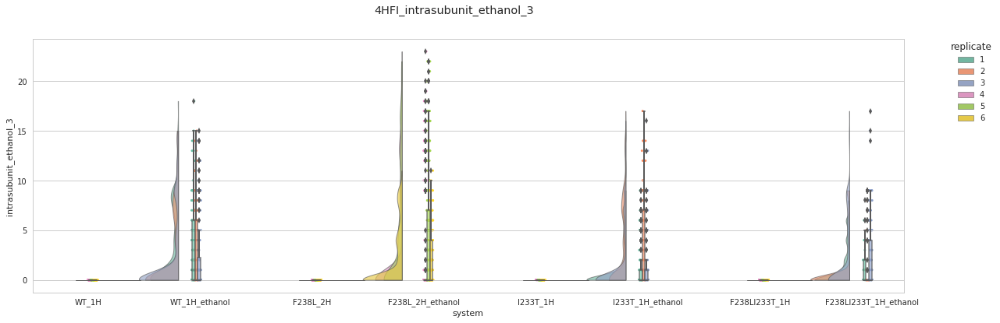

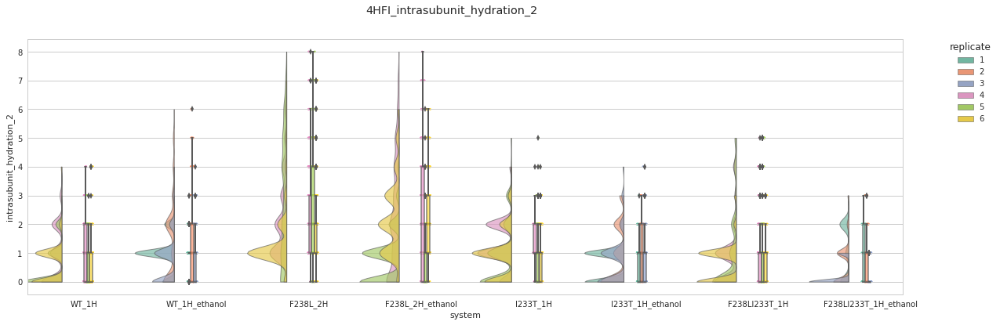

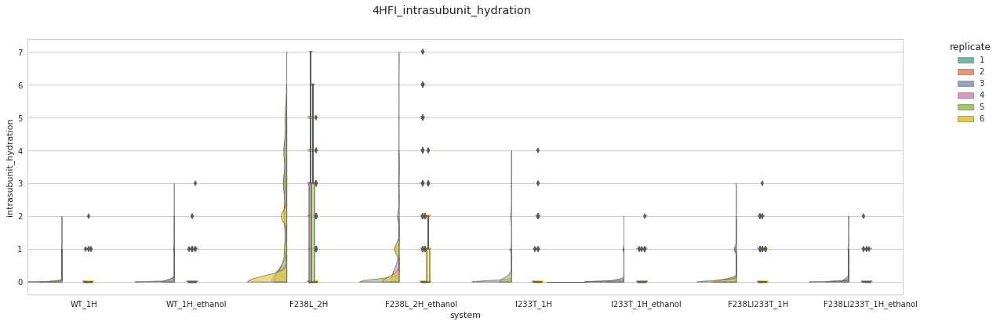

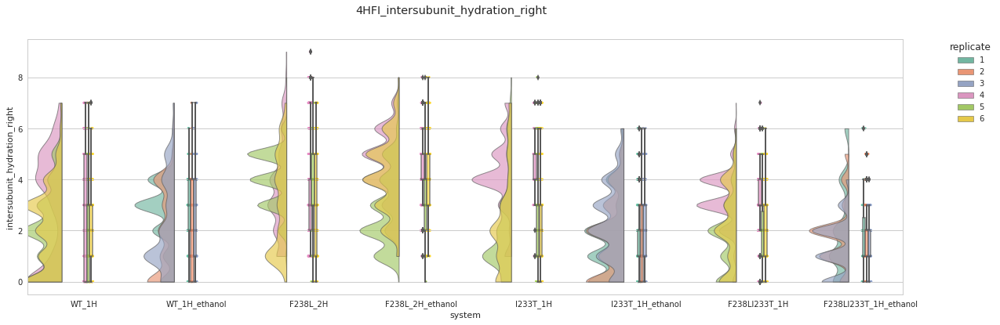

In [306]:
for feature in md_data.columns[6:]:
    fig, ax = plt.subplots(figsize=(20, 6))
    fig.suptitle('4HFI_' + feature)
    pt.RainCloud(x = 'system', y = feature, hue='replicate',data = md_data[md_data.traj_time>40],  
        palette = 'Set2', bw = .2,width_viol = .7,ax=ax,alpha = .65,dodge = True)
#    group = md_data_235.groupby(['system'],sort=False)[feature]
#    mean = group.mean()
#    errors = group.sem()
#    mean.plot.bar(yerr=errors,ax=ax)
    ax.set_xticklabels(['WT_1H','WT_1H_ethanol','F238L_2H','F238L_2H_ethanol','I233T_1H','I233T_1H_ethanol','F238LI233T_1H','F238LI233T_1H_ethanol'])


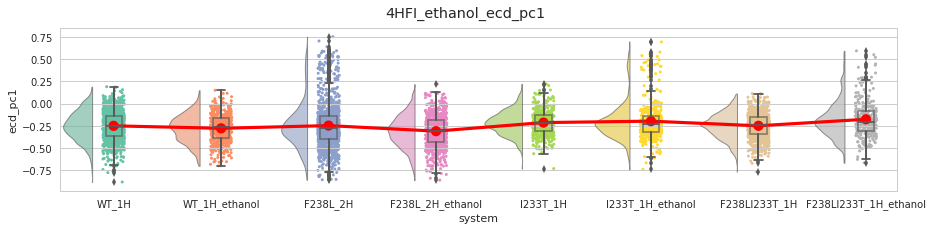

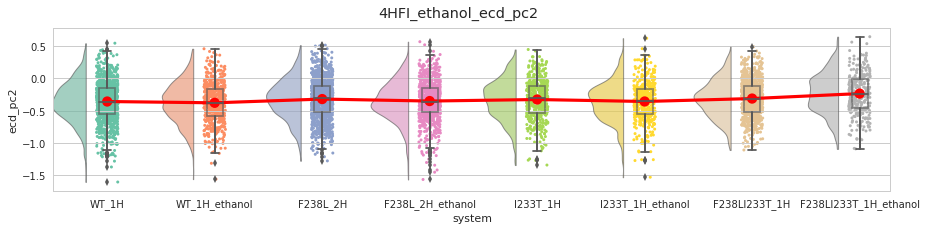

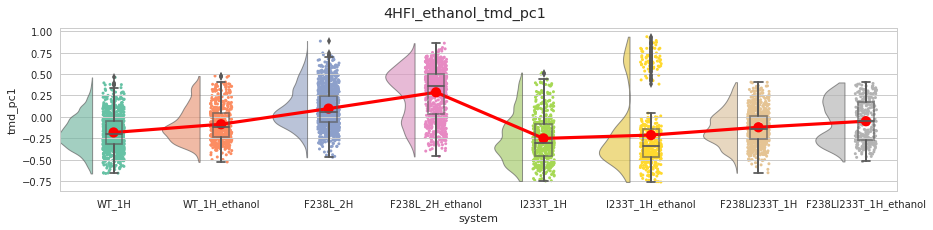

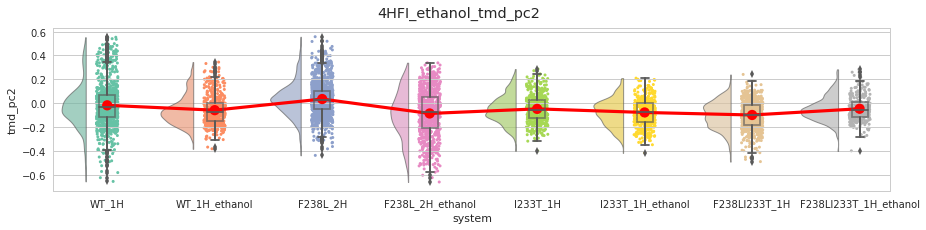

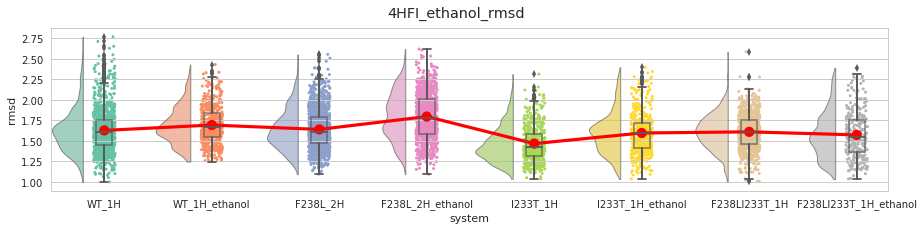

...

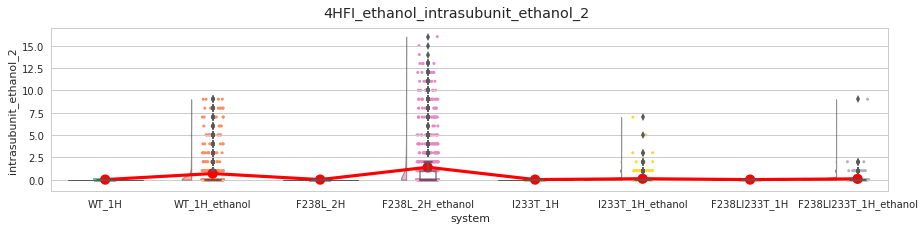

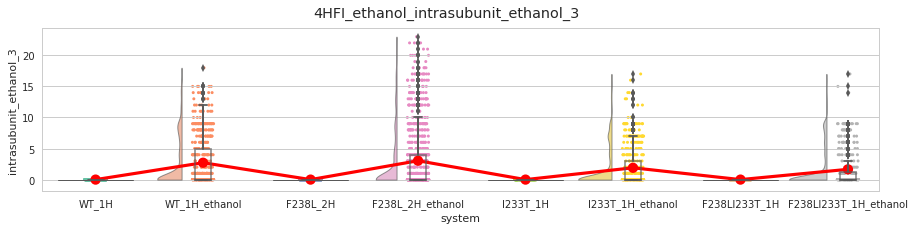

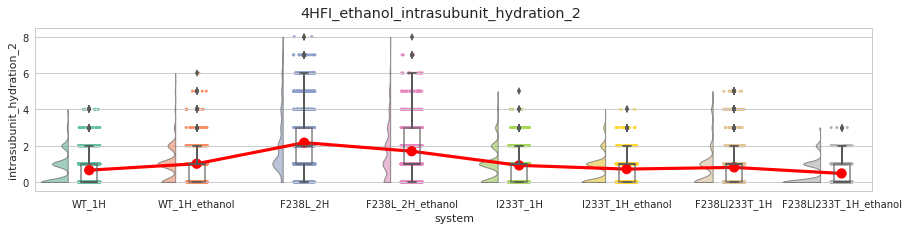

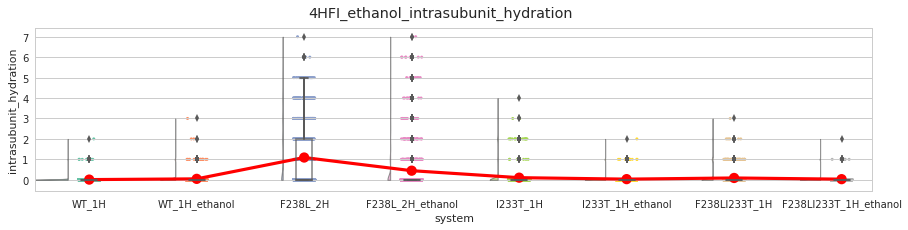

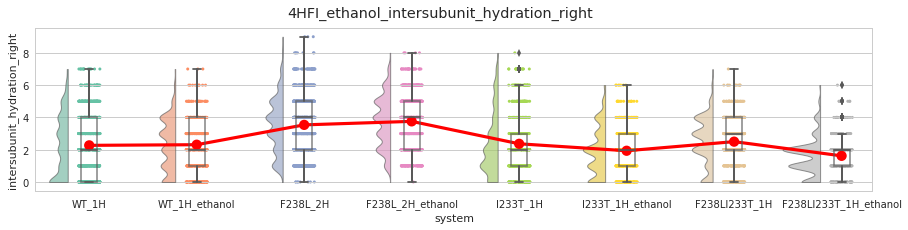

In [305]:
for feature in md_data.columns[6:]:
    fig, ax = plt.subplots(figsize=(15, 3))
    fig.suptitle('4HFI_ethanol_' + feature)
    pt.RainCloud(x = 'system', y = feature, data = md_data[md_data.traj_time>40],  
        palette = 'Set2', bw = .2,width_viol = .7,ax=ax,alpha = .65,dodge = True,pointplot=True)
#    group = md_data_235.groupby(['system'],sort=False)[feature]
#    mean = group.mean()
#    errors = group.sem()
#    mean.plot.bar(yerr=errors,ax=ax)
    ax.set_xticklabels(['WT_1H','WT_1H_ethanol','F238L_2H','F238L_2H_ethanol','I233T_1H','I233T_1H_ethanol','F238LI233T_1H','F238LI233T_1H_ethanol'])


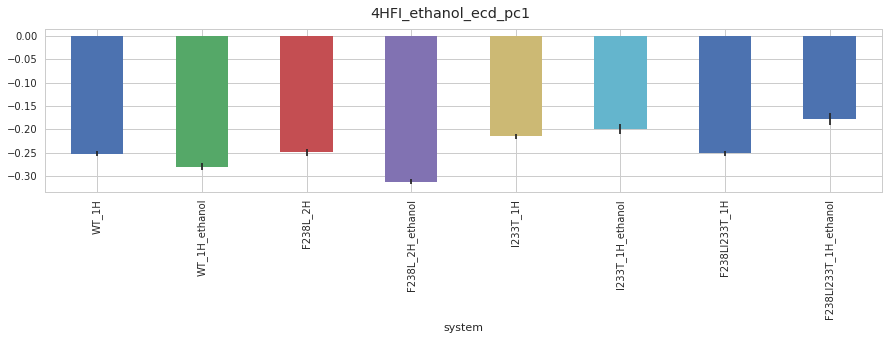

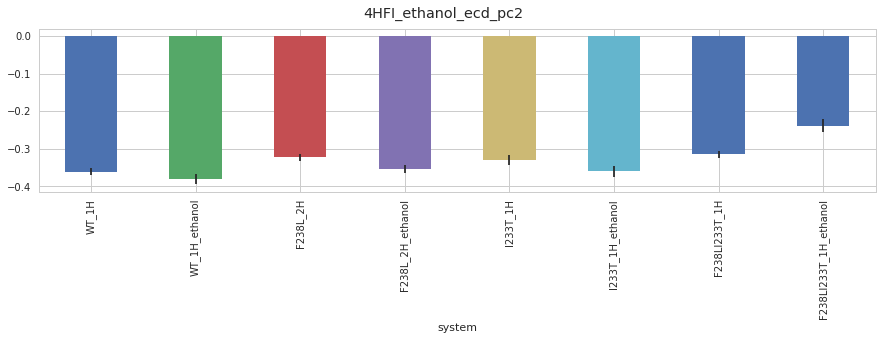

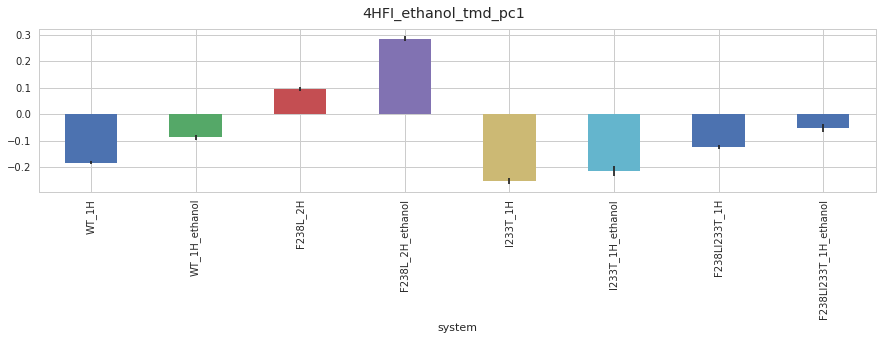

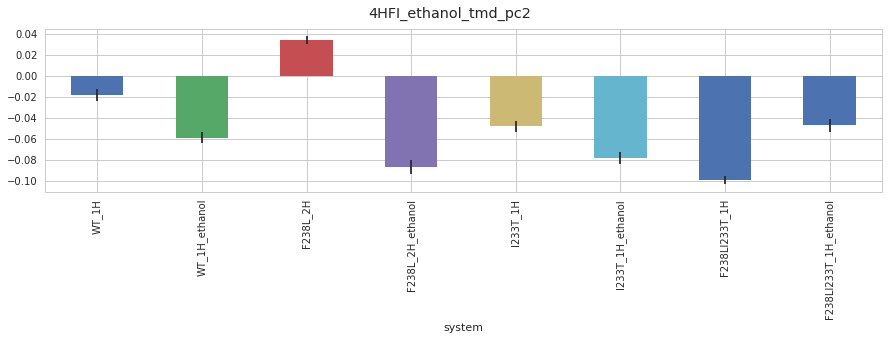

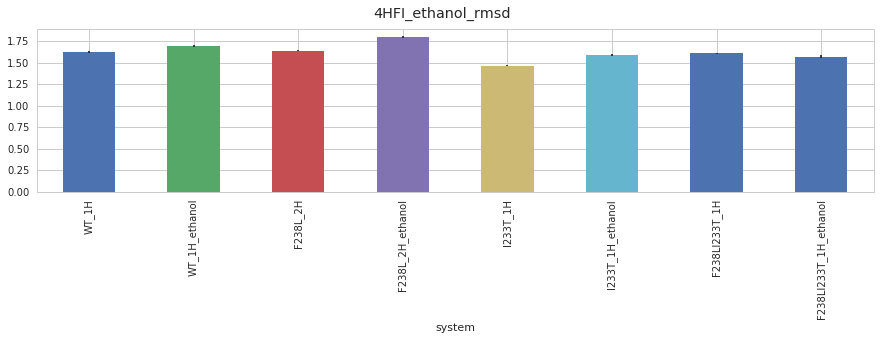

...

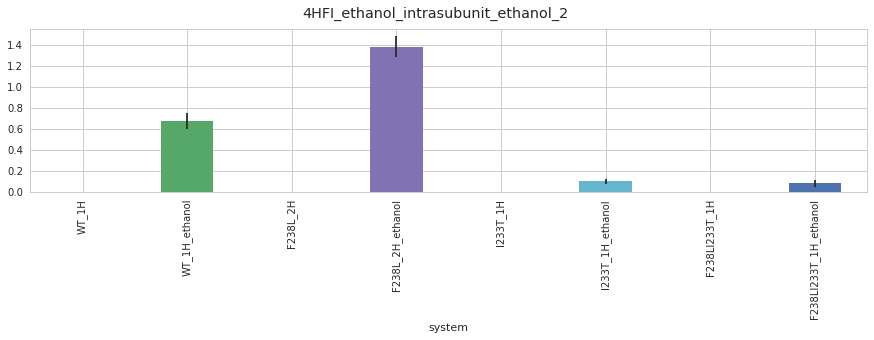

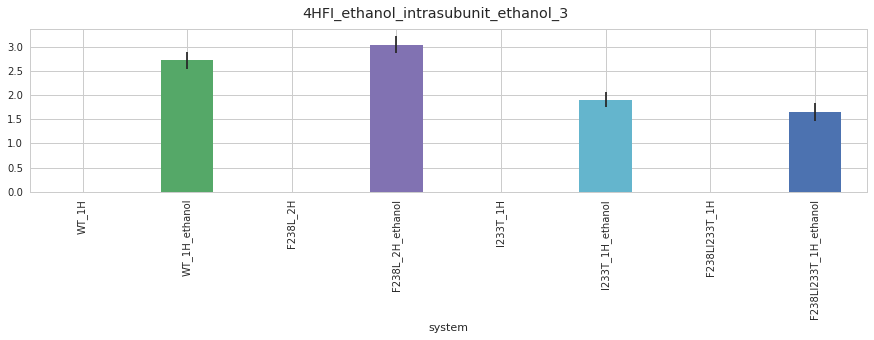

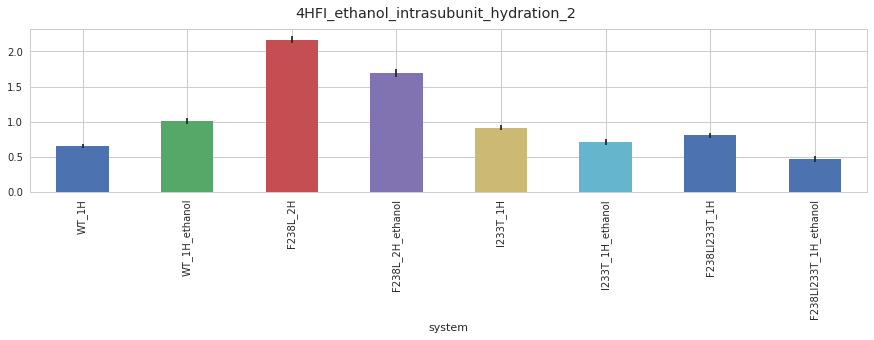

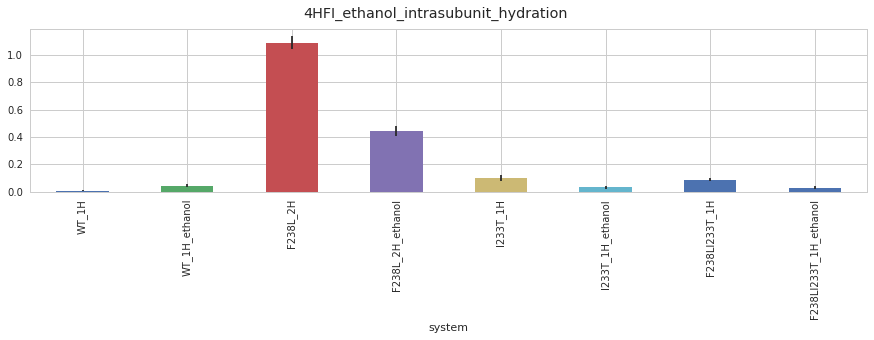

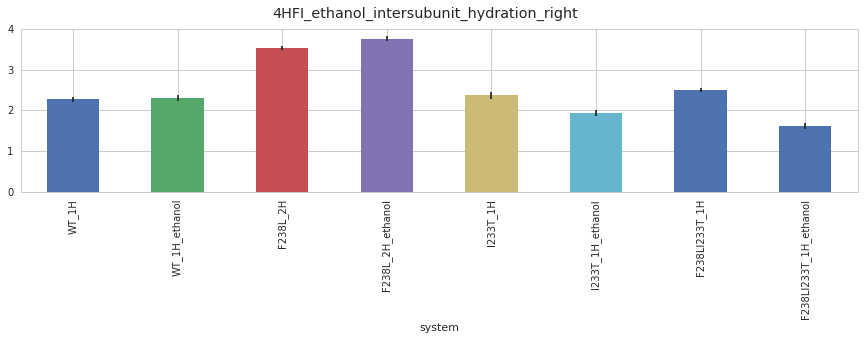

In [308]:
for feature in md_data.columns[6:]:
    fig, ax = plt.subplots(figsize=(15, 3))
    fig.suptitle('4HFI_ethanol_' + feature)
#    pt.RainCloud(x = 'system', y = fegetature, data = md_data[md_data.traj_time>40],  
#        palette = 'Set2', bw = .2,width_viol = .7,ax=ax,alpha = .65,dodge = True,pointplot=True)
    group = md_data[md_data.traj_time>40].groupby(['system'],sort=False)[feature]
    mean = group.mean()
    errors = group.sem()
    mean.plot.bar(yerr=errors,ax=ax)
    ax.set_xticklabels(['WT_1H','WT_1H_ethanol','F238L_2H','F238L_2H_ethanol','I233T_1H','I233T_1H_ethanol','F238LI233T_1H','F238LI233T_1H_ethanol'])


### Step 7

In [165]:
#Subunit of resid 1

In [166]:
resid_pair_hbond_dataframe = pd.DataFrame(columns=list(['traj_note','traj_time','subunit','resid1','resid2','inter_hbond','intra_hbond','inter_water_bridge','intra_water_bridge']))

In [124]:
resid_pair_hbond_dataframe.to_pickle('pair_hbond_4HFI_2H.pickle')

In [167]:
import ast

In [168]:
def append_resid_pair_hbond_data(traj_note, location = default_location, skip = default_skip):
    top_location = traj_note + '/' + traj_note + ".system.pdb"
    traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
    traj = md.load(location + traj_location,top = location + top_location)
    topology = traj.topology
    table, bonds = topology.to_dataframe()
    n_frames = traj.n_frames
    resid_pair_hbond_dataframe = pd.DataFrame(columns=list(['traj_note','traj_time','subunit','resid1','resid2','inter_hbond','intra_hbond','inter_water_bridge','intra_water_bridge']))
#        resid_pair_hbond_dataframe = pd.read_pickle('pair_hbond.pickle')
    for resid1 in np.arange(198,315):
        hbond_dataframe = pd.read_csv(location + traj_note + '/hbond_analysis/' + str(resid1) + '_hbond_list_subunit.csv')
        hbond_dataframe['counterpart'] = hbond_dataframe['counterpart'].apply(lambda x: ast.literal_eval(x))
        water_bridge_dataframe = pd.read_csv(location + traj_note + '/hbond_analysis/' + str(resid1) + '_water_bridge_list_subunit.csv')
        water_bridge_dataframe['counterpart'] = water_bridge_dataframe['counterpart'].apply(lambda x: ast.literal_eval(x))

        for time in range(0,n_frames*10000,10000): 
            for subunit in range(0,5):
                for residue_id in set(hbond_dataframe['resid']):

                    counterpart_residue = hbond_dataframe[(hbond_dataframe['resid'] == residue_id) & (hbond_dataframe['traj_time'] == time) & (hbond_dataframe['subunit'] == subunit)]['counterpart']
                    for counterpart_residue_list in counterpart_residue:
                        for counterpart_residue_id in counterpart_residue_list:
                            if table.loc[counterpart_residue_id].chainID != table.loc[residue_id].chainID:
                                resid_pair_hbond_dataframe = resid_pair_hbond_dataframe.append({'traj_note': traj_note, 'traj_time': time/10000,'subunit':subunit,'resid1': resid1, 'resid2':table.loc[counterpart_residue_id].resSeq, 'inter_hbond': table.loc[counterpart_residue_id].resSeq},ignore_index=True)

                            else:
                                resid_pair_hbond_dataframe = resid_pair_hbond_dataframe.append({'traj_note': traj_note, 'traj_time': time/10000,'subunit':subunit,'resid1': resid1, 'resid2':table.loc[counterpart_residue_id].resSeq, 'intra_hbond': table.loc[counterpart_residue_id].resSeq},ignore_index=True)

            for subunit in range(0,5):

                for residue_id in set(water_bridge_dataframe['resid']):
                    counterpart_residue = water_bridge_dataframe[(water_bridge_dataframe['resid'] == residue_id) & (water_bridge_dataframe['traj_time'] == time) & (water_bridge_dataframe['subunit'] == subunit)]['counterpart'].values
                    for counterpart_residue_list in counterpart_residue:
                        for counterpart_residue_id in counterpart_residue_list:
                            if table.loc[counterpart_residue_id].chainID != table.loc[residue_id].chainID:
                                resid_pair_hbond_dataframe = resid_pair_hbond_dataframe.append({'traj_note': traj_note, 'traj_time': time/10000,'subunit':subunit,'resid1': resid1, 'resid2':table.loc[counterpart_residue_id].resSeq, 'inter_water_bridge': table.loc[counterpart_residue_id].resSeq},ignore_index=True)
                                resid_pair_hbond_dataframe = resid_pair_hbond_dataframe.append({'traj_note': traj_note, 'traj_time': time/10000,'subunit':subunit,'resid1': table.loc[counterpart_residue_id].resSeq, 'resid2':resid1, 'inter_water_bridge': resid1},ignore_index=True)

                            else:
                                resid_pair_hbond_dataframe = resid_pair_hbond_dataframe.append({'traj_note': traj_note, 'traj_time': time/10000,'subunit':subunit,'resid1': resid1, 'resid2':table.loc[counterpart_residue_id].resSeq, 'intra_water_bridge': table.loc[counterpart_residue_id].resSeq},ignore_index=True)
                                resid_pair_hbond_dataframe = resid_pair_hbond_dataframe.append({'traj_note': traj_note, 'traj_time': time/10000,'subunit':subunit,'resid1': table.loc[counterpart_residue_id].resSeq, 'resid2':resid1, 'intra_water_bridge': resid1},ignore_index=True)

    resid_pair_hbond_dataframe.to_pickle('hbond_pair/' + traj_note + '_pair_hbond_subunit.pickle')


In [169]:
from joblib import Parallel, delayed
import multiprocessing
num_cores = multiprocessing.cpu_count()
Parallel(n_jobs=num_cores-2)(delayed(append_resid_pair_hbond_data)(traj_note) for traj_note in traj_notes)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [258]:
pair_hbond = pd.DataFrame()
for traj_note in traj_notes:
    pair_hbond = pair_hbond.append(pd.read_pickle('hbond_pair/' + traj_note + '_pair_hbond_subunit.pickle'))
pair_hbond.to_pickle('pair_hbond_4HFI_235_subunit.pickle')

In [46]:
md_data = pd.read_pickle('glic_activation_open_235.pickle')

In [259]:
def create_hbond_data(resid1,resid2,hbond_type,md_data):
    interaction_list = []
    interaction_df = pair_hbond[(pair_hbond.resid1 == resid1) & (pair_hbond.resid2 == resid2) & (pair_hbond[hbond_type] > 0 )]
    for traj_note in traj_notes:
        location = default_location
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip10.ca.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        n_frames = traj.n_frames
        for traj_time in range(0,n_frames):
            for subunit in range(0,5):
                interaction_list.append(interaction_df[(interaction_df.traj_note == traj_note) & (interaction_df.traj_time == traj_time) & (interaction_df.subunit == subunit)].shape[0])
    md_data[hbond_type + '_' + str(resid1) + '_' + str(resid2)] = interaction_list

In [261]:
create_hbond_data(200,239,'inter_water_bridge',md_data)

In [264]:
create_hbond_data(200,243,'inter_water_bridge',md_data)

In [265]:
create_hbond_data(200,263,'inter_water_bridge',md_data)

In [266]:
create_hbond_data(200,243,'inter_hbond',md_data)

In [267]:
create_hbond_data(200,239,'inter_hbond',md_data)

In [268]:
create_hbond_data(205,235,'intra_hbond',md_data)

In [ ]:
create_hbond_data(205,235,'intra_water_bridge',md_data)

In [ ]:
create_hbond_data(263,243,'intra_water_bridge',md_data)

In [ ]:
create_hbond_data(235,259,'intra_water_bridge',md_data)

In [272]:
create_hbond_data(235,259,'intra_hbond',md_data)

In [310]:
create_hbond_data(243,253,'intr_hbond',md_data)

,MD_name,pH,replicate,intersubunit,traj_time,system,ecd_pc1,ecd_pc2,tmd_pc1,tmd_pc2,...,beta_expansion,intersubunit_ethanol_right,intersubunit_ethanol_left,intersubunit_ethanol_238_right,intrasubunit_ethanol,intrasubunit_ethanol_2,intrasubunit_ethanol_3,intrasubunit_hydration_2,intrasubunit_hydration,intersubunit_hydration_right
1,4HFI,46,4,0,0,0,-0.215474,-0.026823,-0.228624,-0.071307,...,1.105302,0,0,0,0,0,0,0,0,1
2,4HFI,46,4,1,0,0,-0.317403,0.044672,-0.311558,0.016192,...,1.168593,0,0,0,0,0,0,1,0,3
3,4HFI,46,4,2,0,0,-0.642882,0.585838,-0.041180,0.072007,...,1.120360,0,0,0,0,0,0,0,0,3
4,4HFI,46,4,3,0,0,-0.439443,-0.314340,-0.167295,0.044079,...,1.122440,0,0,0,0,0,0,0,0,2
5,4HFI,46,4,4,0,0,-0.158863,-0.769259,-0.037339,0.070557,...,1.188438,0,0,0,0,0,0,0,0,3
6,4HFI,46,4,0,1,0,-0.258881,-0.355206,-0.225332,0.009515,...,1.144158,0,0,0,0,0,0,0,0,2
7,4HFI,46,4,1,1,0,-0.284451,-0.129224,-0.176422,-0.022138,...,1.122719,0,0,0,0,0,0,1,1,1
8,4HFI,46,4,2,1,0,-0.147408,-0.044563,-0.312458,-0.082643,...,1.076658,0,0,0,0,0,0,1,0,1
9,4HFI,46,4,3,1,0,-0.333186,0.169364,-0.184393,0.088598,...,1.124198,0,0,0,0,0,0,0,0,2
10,4HFI,46,4,4,1,0,-0.184223,-0.043093,-0.104070,-0.033530,...,1.079741,0,0,0,0,0,0,0,0,2


In [121]:
md_data_235.to_pickle('glic_activation_open_235.pickle')

In [311]:
def create_Hbond_network_analysis_data(traj_note, location = default_location, skip=default_skip):
    top_location = traj_note + '/' + traj_note + ".system.pdb"
    traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
    traj = md.load(location + traj_location,top = location + top_location)
    topology = traj.topology
    table, bonds = topology.to_dataframe()
    n_frames = traj.n_frames
    zero_data = np.zeros(shape=([118*5,118*5]))
    hbond_network_dataframe = pd.DataFrame()
    for time in range(0,n_frames*10000,10000):  
        hbond_network = pd.DataFrame(zero_data,columns=np.asarray([np.arange(193,311),np.arange(193,311) + 311,np.arange(193,311) + 311 * 2,np.arange(193,311) + 311 * 3,np.arange(193,311) + 311 * 4]).flatten())
        hbond_network['traj_time'] = time/10000
        hbond_network['residue'] = np.asarray([np.arange(193,311),np.arange(193,311) + 311,np.arange(193,311) + 311 * 2,np.arange(193,311) + 311 * 3,np.arange(193,311) + 311 * 4]).flatten()
        hbond_network_dataframe = hbond_network_dataframe.append(hbond_network,ignore_index=True)
    for time in range(0,n_frames*10000,10000):  
        for resid in range(198,315):
            hbond_dataframe = pd.read_csv(location + traj_note + '/hbond_analysis/' + str(resid) + '_hbond_list.csv')
            hbond_dataframe['counterpart'] = hbond_dataframe['counterpart'].apply(lambda x: ast.literal_eval(x))
            water_bridge_dataframe = pd.read_csv(location + traj_note + '/hbond_analysis/' + str(resid) + '_water_bridge_list.csv')
            water_bridge_dataframe['counterpart'] = water_bridge_dataframe['counterpart'].apply(lambda x: ast.literal_eval(x))

            for residue_id in set(hbond_dataframe['resid']):
                counterpart_residue = hbond_dataframe[(hbond_dataframe['resid'] == residue_id) & (hbond_dataframe['traj_time'] == time)]['counterpart']
                for counterpart_residue_list in counterpart_residue:
                    for counterpart_residue_id in counterpart_residue_list:
                        if (table.loc[counterpart_residue_id].resSeq >= 198) & (table.loc[counterpart_residue_id].resSeq <= 315) & (table.loc[residue_id].resSeq >= 198) & (table.loc[residue_id].resSeq <= 315):
                            residue1 = table.loc[residue_id].resSeq + (table.loc[residue_id].chainID) * 311 - 5
                            residue2 = table.loc[counterpart_residue_id].resSeq + (table.loc[counterpart_residue_id].chainID) * 311 - 5

                            hbond_network_dataframe.loc[(hbond_network_dataframe.traj_time == time/10000) & (hbond_network_dataframe.residue == residue1),residue2] = 1
                            hbond_network_dataframe.loc[(hbond_network_dataframe.traj_time == time/10000) & (hbond_network_dataframe.residue == residue2),residue1] = 1

            for residue_id in set(water_bridge_dataframe['resid']):
                counterpart_residue = water_bridge_dataframe[(water_bridge_dataframe['resid'] == residue_id) & (water_bridge_dataframe['traj_time'] == time)]['counterpart'].values
                for counterpart_residue_list in counterpart_residue:
                    for counterpart_residue_id in counterpart_residue_list:
                        if (table.loc[counterpart_residue_id].resSeq >= 198) & (table.loc[counterpart_residue_id].resSeq <= 315) & (table.loc[residue_id].resSeq >= 198) & (table.loc[residue_id].resSeq <= 315):
                            residue1 = table.loc[residue_id].resSeq + (table.loc[residue_id].chainID) * 311 - 5
                            residue2 = table.loc[counterpart_residue_id].resSeq + (table.loc[counterpart_residue_id].chainID) * 311 - 5
                            hbond_network_dataframe.loc[(hbond_network_dataframe.traj_time == time /10000) & (hbond_network_dataframe.residue == residue1),residue2] = 1
                            hbond_network_dataframe.loc[(hbond_network_dataframe.traj_time == time /10000) & (hbond_network_dataframe.residue == residue2),residue1] = 1

    hbond_network_dataframe.to_csv(location + traj_note + '/hbond_analysis/hbond_network.csv')
    print('finishing!')
   #         print('At time ' + str(time) + ', in total ' + str(n_hbond) + ' hydrogen bonds between residues, resid '
   #               + str(resid) + ' forms ' + str(n_intra_hbond) + ' intra-subunit H-bond and ' + str(n_inter_hbond) + ' inter-subunit H-bond.')

In [312]:
def create_hbond_contact_map(traj_note, location = default_location, skip=default_skip):
    top_location = traj_note + '/' + traj_note + ".ca.pdb"
    traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
    traj = md.load(location + traj_location,top = location + top_location)
    n_frames = traj.n_frames
    hbond_contact_map = pd.DataFrame(columns=['residue1','residue2','interaction'])
    hbond_network_dataframe = pd.read_csv(location + traj_note + '/hbond_analysis/hbond_network.csv')
    for column in hbond_network_dataframe.columns:
        if (column !=  'traj_time') & (column != 'residue') & (column != 'Unnamed: 0'):
            residue1s = hbond_network_dataframe.loc[(hbond_network_dataframe[column] != 0)]['residue'].values
            residue2 = int(column)
            for residue1 in set(residue1s):
                if hbond_contact_map[(hbond_contact_map.residue1 == residue1) & (hbond_contact_map.residue2 == residue2)].empty:
                    interaction_sum = hbond_network_dataframe[(hbond_network_dataframe[column] != 0) & (hbond_network_dataframe.residue == residue1)].shape[0]
                    hbond_contact_map = pd.concat([hbond_contact_map,pd.DataFrame([[residue1,residue2,interaction_sum / n_frames]],columns=['residue1','residue2','interaction'])],ignore_index=True)
                else:
                    interaction_sum = hbond_network_dataframe[(hbond_network_dataframe[column] != 0) & (hbond_network_dataframe.residue == residue1)].shape[0]
                    hbond_contact_map.loc[(hbond_contact_map.residue1 == residue1) & (hbond_contact_map.residue2 == residue2),'interaction'] += interaction_sum / n_frames
    #print(hbond_contact_map)
    hbond_contact_map.to_csv(location + traj_note + '/hbond_analysis/hbond_contact_map.csv')
    print('finishing! ' + traj_note)

In [12]:
trans_ind = np.asarray([np.arange(193,311),np.arange(504,622),np.arange(815,933),np.arange(1126,1244),np.arange(1437,1555)]).flatten()

In [13]:
def transform_hbond_network_data(traj_note):
    hbond_data = pd.read_csv(default_location + traj_note + '/hbond_analysis/hbond_contact_map.csv')
    hbond_data_all = pd.DataFrame(columns=['residue1','residue2','hbond'])
    for ind in trans_ind:
        hbond_data_all = hbond_data_all.append(pd.DataFrame(np.concatenate(([np.zeros([590]) + ind], [trans_ind],[np.zeros([590])]), axis=0).T,columns=['residue1','residue2','hbond']),ignore_index=True)
    for residue1,residue2 in hbond_data[['residue1','residue2']].values:
        hbond_data_all.loc[(hbond_data_all.residue1 == residue1) & (hbond_data_all.residue2 == residue2),'hbond'] = hbond_data[(hbond_data.residue1 == residue1) & (hbond_data.residue2 == residue2)]['interaction'].values 
    hbond_data_all.to_csv(default_location + traj_note + '/hbond_analysis/hbond_contact_map_complete.csv')
#    hbond_data_trans.append(hbond_data_all['hbond'].values.reshape([590,590]))
#    hbond_data_mean = np.mean(hbond_data_trans,axis=0)
#    np.savetxt(default_location + traj_notes[0] + '/hbond_analysis/' + traj_notes[0][:-4] + '_hbond_network_data_transmembrane_mean.dat',hbond_data_mean)        

In [ ]:
from joblib import Parallel, delayed
import multiprocessing
num_cores = multiprocessing.cpu_count()
Parallel(n_jobs=num_cores)(delayed(create_Hbond_network_analysis_data)(traj_note) for traj_note in traj_notes)
Parallel(n_jobs=num_cores)(delayed(create_hbond_contact_map)(traj_note) for traj_note in traj_notes)
Parallel(n_jobs=num_cores)(delayed(transform_hbond_network_data)(traj_note) for traj_note in traj_notes)


In [313]:
def gather_replicates(traj_notes,location = default_location):
    pearson_avg = []
    for traj_note in traj_notes:
        contact_map = pd.read_csv(location + traj_note + '/hbond_analysis/hbond_contact_map_complete.csv')
        pearson_avg.append(contact_map['hbond'].values)
    contact_map['hbond'] = np.mean(pearson_avg,axis=0)
    return contact_map

In [314]:
def plot_hbond_map(data,ax,note):
    data[data.hbond >= 0.5].plot(kind='scatter',x='residue1',y='residue2',c='hbond',colormap='autumn',ax=ax)
    ax.set_title(note + ' Hbond & Water Bridge Map (lifetime > 0.5)')
    plt.show()

In [315]:
def plot_intra_hbond_map(data,note,ax):
    data1 = data[(data.residue1 <= 311) & (data.residue2 <= 311)]
    data2 = data[(data.residue1 > 311) & (data.residue1 <= 311 *2) &(data.residue2 > 311) & (data.residue2 <= 311 *2)]
    data3 = data[(data.residue1 > 311 *2) & (data.residue1 <= 311 *3) &(data.residue2 > 311 *2) & (data.residue2 <= 311 *3)]
    data4 = data[(data.residue1 > 311 *3) & (data.residue1 <= 311 *4) &(data.residue2 > 311 *3) & (data.residue2 <= 311 *4)]
    data5 = data[(data.residue1 > 311 *4) & (data.residue1 <= 311 *5) &(data.residue2 > 311 *4) & (data.residue2 <= 311 *5)]
    data2.residue1 = data1.residue1.values
    data2.residue2 = data1.residue2.values
    data3.residue1 = data1.residue1.values
    data3.residue2 = data1.residue2.values   
    data4.residue1 = data1.residue1.values
    data4.residue2 = data1.residue2.values   
    data5.residue1 = data1.residue1.values
    data5.residue2 = data1.residue2.values   
    data1 = data1[data1['hbond'] >= 0.1].reset_index()
    data2 = data2[data2['hbond'] >= 0.1].reset_index()
    data3 = data3[data3['hbond'] >= 0.1].reset_index()
    data4 = data4[data4['hbond'] >= 0.1].reset_index()
    data5 = data5[data5['hbond'] >= 0.1].reset_index()
    data_intra = pd.DataFrame(columns=['residue1','residue2','hbond'])
    for pair in np.array(list(set([tuple(t) for t in pd.concat([data1,data2,data3,data4,data5])[['residue1','residue2']].values]))):
        data_intra = pd.concat([data_intra,pd.DataFrame([[int(pair[0]) + 5,int(pair[1]) + 5,
#                           np.mean([data1[(data1.residue1 == pair[0]) & (data1.residue2 == pair[1])]['hbond'].values,
#                                   data2[(data2.residue1 == pair[0]) & (data2.residue2 == pair[1])]['hbond'].values,
#                                   data3[(data3.residue1 == pair[0]) & (data3.residue2 == pair[1])]['hbond'].values,
#                                   data4[(data4.residue1 == pair[0]) & (data4.residue2 == pair[1])]['hbond'].values,
#                                   data5[(data5.residue1 == pair[0]) & (data5.residue2 == pair[1])]['hbond'].values])]],
                            np.sum(np.sum([data1.loc[(data1.residue1 == pair[0]) & (data1.residue2 == pair[1]),'hbond'].values.tolist(),
                                                                data2.loc[(data2.residue1 == pair[0]) & (data2.residue2 == pair[1]),'hbond'].values.tolist(),
                                                                data3.loc[(data3.residue1 == pair[0]) & (data3.residue2 == pair[1]),'hbond'].values.tolist(),
                                                                data4.loc[(data4.residue1 == pair[0]) & (data4.residue2 == pair[1]),'hbond'].values.tolist(),
                                                                data5.loc[(data5.residue1 == pair[0]) & (data5.residue2 == pair[1]),'hbond'].values.tolist()]))/5]], 
                                                          columns=['residue1','residue2','hbond']
                                  )],ignore_index=True)
    data_intra = data_intra.convert_objects(convert_numeric=True)
    data_intra.plot(kind='scatter',x='residue1',y='residue2',c=data_intra.hbond,colormap='Greens',ax=ax,colorbar=False,vmax=1,vmin=0)
    ax.set_xlim(198,315)
    ax.set_ylim(198,315)
    data_intra.to_csv(note + '_intra_hbond.csv')

In [316]:
def plot_inter_hbond_map(data,note,ax):
    data1 = data[(data.residue1 > 311 * 0) & (data.residue1 <= 311 * 1) &(data.residue2 > 311 * 1) & (data.residue2 <= 311 *2)]
    data2 = data[(data.residue1 > 311 * 1) & (data.residue1 <= 311 * 2) &(data.residue2 > 311 * 2) & (data.residue2 <= 311 *3)]
    data3 = data[(data.residue1 > 311 * 2) & (data.residue1 <= 311 * 3) &(data.residue2 > 311 * 3) & (data.residue2 <= 311 *4)]
    data4 = data[(data.residue1 > 311 * 3) & (data.residue1 <= 311 * 4) &(data.residue2 > 311 * 4) & (data.residue2 <= 311 *5)]
    data5 = data[(data.residue1 > 311 * 4) & (data.residue1 <= 311 * 5) &(data.residue2 > 311 * 0) & (data.residue2 <= 311 * 1)]
    data2.residue1 = data1.residue1.values
    data2.residue2 = data1.residue2.values
    data3.residue1 = data1.residue1.values
    data3.residue2 = data1.residue2.values   
    data4.residue1 = data1.residue1.values
    data4.residue2 = data1.residue2.values   
    data5.residue1 = data1.residue1.values
    data5.residue2 = data1.residue2.values   
    data1 = data1[data1['hbond'] >= 0.1].reset_index()
    data2 = data2[data2['hbond'] >= 0.1].reset_index()
    data3 = data3[data3['hbond'] >= 0.1].reset_index()
    data4 = data4[data4['hbond'] >= 0.1].reset_index()
    data5 = data5[data5['hbond'] >= 0.1].reset_index()
    data_inter = pd.DataFrame(columns=['residue1','residue2','hbond'])
    for pair in np.array(list(set([tuple(t) for t in pd.concat([data1,data2,data3,data4,data5])[['residue1','residue2']].values]))):
                            
        data_inter = pd.concat([data_inter,pd.DataFrame([[int(pair[0]) + 5,int(pair[1]-311) + 5,
                                                        np.sum(np.sum([data1.loc[(data1.residue1 == pair[0]) & (data1.residue2 == pair[1]),'hbond'].values.tolist(),
                                                                data2.loc[(data2.residue1 == pair[0]) & (data2.residue2 == pair[1]),'hbond'].values.tolist(),
                                                                data3.loc[(data3.residue1 == pair[0]) & (data3.residue2 == pair[1]),'hbond'].values.tolist(),
                                                                data4.loc[(data4.residue1 == pair[0]) & (data4.residue2 == pair[1]),'hbond'].values.tolist(),
                                                                data5.loc[(data5.residue1 == pair[0]) & (data5.residue2 == pair[1]),'hbond'].values.tolist()]))/5 
                                                         ]]
                                                        ,columns=['residue1','residue2','hbond'])
                                                         ],ignore_index=True)
    data_inter = data_inter.convert_objects(convert_numeric=True)
    data_inter.plot(kind='scatter',x='residue1',y='residue2',c='hbond',colormap='Greens',ax=ax,colorbar=True,vmax=1,vmin=0)
    ax.set_xlim(198,315)
    ax.set_ylim(198,315)
    data_inter.to_csv(note + '_inter_hbond.csv')

In [317]:
def plot_inter_intra_hbond(traj_notes):
    fig = plt.figure(figsize=[20,10]) 
    ax1 = fig.add_subplot(1,2,1,aspect='equal') 
    ax2 = fig.add_subplot(1,2,2,aspect='equal') 
    plot_intra_hbond_map(gather_replicates(traj_notes),traj_notes[0],ax1)
    plot_inter_hbond_map(gather_replicates(traj_notes),traj_notes[0],ax2)
    plt.suptitle(traj_notes[0])
    plt.tight_layout()
    plt.savefig(traj_notes[0] + '.pdf')
    plt.show()